# Exploratory Data Analysis
Anna Chen
9/26/2024

- This is data from the housing market at Australia

Data Definitions 
- Suburb: Suburb 
- Address: Address 
- Rooms: Number of rooms 
- Type: 
    * br - bedroom(s); 
    * h - house, cottage, villa, semi, terrace; 
    * u - unit, duplex; 
    * t - townhouse; 
    * dev site - development site; 
    * o res - other residential. 
- Price: Price in Australian dollars 
- Method: 
    * S - property sold; 
    * SP - property sold prior; 
    * PI - property passed in; 
    * PN - sold prior not disclosed; 
    * SN - sold not disclosed; 
    * NB - no bid; 
    * VB - vendor bid; 
    * W - withdrawn prior to auction; 
    * SA - sold after auction; 
    * SS - sold after auction price not disclosed; 
    * N/A - price or highest bid not available. 
- SellerG: Real Estate Agent 
- Date: Date sold 
- Distance: Distance from CBD in Kilometers 
- Postcode: Postal code 
- Bedroom2: Scraped # of Bedrooms 
- Bathroom: Number of Bathrooms 
- Car: Number of car spots 
- Landsize: Land Size in Meters 
- BuildingArea: Building Size in Meters 
- YearBuilt: Year the house was built 
- CouncilArea: Governing council for the area 
- Lattitude: Self explanatory 
- Longtitude: Self explanatory 
- Regionname: General Region (West, Northwest, North, Northeast …etc) 
- Propertycount: Number of properties that exist in the suburb.

In [1]:
# import the needed library
import pandas as pd
import seaborn as sns

In [2]:
# Load the dataset
df = pd.read_csv('AustralianHousing.csv')

In [3]:
print(df)

           Suburb             Address  Rooms Type      Price Method  \
0      Abbotsford       68 Studley St      2    h        NaN     SS   
1      Abbotsford        85 Turner St      2    h  1480000.0      S   
2      Abbotsford     25 Bloomburg St      2    h  1035000.0      S   
3      Abbotsford  18/659 Victoria St      3    u        NaN     VB   
4      Abbotsford        5 Charles St      3    h  1465000.0     SP   
...           ...                 ...    ...  ...        ...    ...   
34852  Yarraville         13 Burns St      4    h  1480000.0     PI   
34853  Yarraville       29A Murray St      2    h   888000.0     SP   
34854  Yarraville      147A Severn St      2    t   705000.0      S   
34855  Yarraville    12/37 Stephen St      3    h  1140000.0     SP   
34856  Yarraville    3 Tarrengower St      2    h  1020000.0     PI   

             SellerG        Date  Distance  Postcode  ...  Bathroom  Car  \
0             Jellis   3/09/2016       2.5    3067.0  ...       1.0  1.

# Evaluating Data Quality
Look out for:
- Bias
- Missing Data
- Duplicate Data
- Incorrect Data

Here I will first focus on  **Handling Missing Data**, **Handling Duplicated Data**, and **Handling Incorrect Data**.

# Evaluating Data Quality 
## - Handling Duplicated Data

In [4]:
# Find duplicate rows
duplicates = df[df.duplicated()]

# Print duplicate rows
print(duplicates)

           Suburb        Address  Rooms Type  Price Method SellerG  \
15858  Nunawading  1/7 Lilian St      3    t    NaN     SP  Jellis   

             Date  Distance  Postcode  ...  Bathroom  Car  Landsize  \
15858  17/06/2017      15.4    3131.0  ...       3.0  2.0     405.0   

       BuildingArea  YearBuilt              CouncilArea Lattitude  Longtitude  \
15858         226.0     2000.0  Manningham City Council -37.82678   145.16777   

                 Regionname Propertycount  
15858  Eastern Metropolitan        4973.0  

[1 rows x 21 columns]


* Because there is only one row of duplicated data, I am just going to drop it

In [5]:
# Remove duplicates in place, keeping the first occurrence
df.drop_duplicates(inplace=True)

print(df)

           Suburb             Address  Rooms Type      Price Method  \
0      Abbotsford       68 Studley St      2    h        NaN     SS   
1      Abbotsford        85 Turner St      2    h  1480000.0      S   
2      Abbotsford     25 Bloomburg St      2    h  1035000.0      S   
3      Abbotsford  18/659 Victoria St      3    u        NaN     VB   
4      Abbotsford        5 Charles St      3    h  1465000.0     SP   
...           ...                 ...    ...  ...        ...    ...   
34852  Yarraville         13 Burns St      4    h  1480000.0     PI   
34853  Yarraville       29A Murray St      2    h   888000.0     SP   
34854  Yarraville      147A Severn St      2    t   705000.0      S   
34855  Yarraville    12/37 Stephen St      3    h  1140000.0     SP   
34856  Yarraville    3 Tarrengower St      2    h  1020000.0     PI   

             SellerG        Date  Distance  Postcode  ...  Bathroom  Car  \
0             Jellis   3/09/2016       2.5    3067.0  ...       1.0  1.

# Evaluating Data Quality 
## - Handling Incorrect Data
    * Check if the latitude/longitude values fall within a reasonable range for Australia:
    * Removing Non-Sensible Rows (e.g., Negative Prices or Land Sizes)

* Check if the latitude/longitude values fall within a reasonable range for Australia:
    * Latitude: -10 to -45
    * Longitude: 110 to 155


In [6]:
# Filter for valid latitude and longitude
df_valid = df[(df['Lattitude'].between(-45, -10)) & 
               (df['Longtitude'].between(110, 155))]

# Check shape of valid data
print("Valid data: ", df_valid.shape)

# Filter for invalid latitude and longitude
df_invalid = df[~((df['Lattitude'].between(-45, -10)) & 
                  (df['Longtitude'].between(110, 155)))]

# Check shape of invalid data
print("Invalid data: ",df_invalid.shape)

print("\n------   Invalid data   --------\n", df_invalid)

Valid data:  (26880, 21)
Invalid data:  (7976, 21)

------   Invalid data   --------
              Suburb              Address  Rooms Type      Price Method  \
15       Abbotsford     217 Langridge St      3    h  1000000.0      S   
16       Abbotsford      18a Mollison St      2    t   745000.0      S   
19       Abbotsford  403/609 Victoria St      2    u   542000.0      S   
21       Abbotsford    25/84 Trenerry Cr      2    u   760000.0     SP   
22       Abbotsford    106/119 Turner St      1    u   481000.0     SP   
...             ...                  ...    ...  ...        ...    ...   
34838  Williamstown   11/81 Melbourne Rd      2    u   450000.0     SP   
34839  Williamstown     24/18 Station Rd      2    u   475000.0     SP   
34840  Williamstown      3/2 Thompson St      2    u   520000.0     VB   
34844       Windsor     4/16 Lewisham Rd      1    u   440000.0     SP   
34855    Yarraville     12/37 Stephen St      3    h  1140000.0     SP   

             SellerG     

#### Since the portion of data that is invalid is quite big, I print it out to check, and found that the invalid data might mostly be caused by missing data.

In [7]:
# Seperate the data into 3 portions: Valid, Invalid due to weird value, Null
# Filter for valid latitude and longitude
df_valid = df[(df['Lattitude'].between(-45, -10)) & 
              (df['Longtitude'].between(110, 155))]

# Filter for invalid latitude and longitude due to weird numbers
df_invalid_weird = df[~((df['Lattitude'].between(-45, -10)) & 
                       (df['Longtitude'].between(110, 155))) & 
                      df['Lattitude'].notna() & df['Longtitude'].notna()]

# Filter for invalid latitude and longitude due to null values
df_invalid_null = df[df['Lattitude'].isna() | df['Longtitude'].isna()]

# Check shapes of each section
print("Valid data: ", df_valid.shape)
print("Invalid data - weird numbers: ", df_invalid_weird.shape)
print("Invalid data - null values: ", df_invalid_null.shape)

Valid data:  (26880, 21)
Invalid data - weird numbers:  (0, 21)
Invalid data - null values:  (7976, 21)


#### The latitude and longtitude data are all within reasonable range or null. I will handle the missing value later with other missing data.

* Removing Non-Sensible Rows
    * These columns should not have a negative value
        * Rooms
        * Price
        * Distance
        * Bedroom2
        * Bathroom
        * Car
        * Landsize
        * BuildingArea
        * Propertycount 

In [8]:
# Check for non-sensible values

# List of columns that should not have negative values
non_negative_columns = ['Rooms', 'Price', 'Distance', 'Bedroom2', 'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'Propertycount']

# Filter to find rows with negative values in any of the specified columns
df_check_negative = df[df[non_negative_columns].lt(0).any(axis=1)]

print("Original dataframe shape: ", df.shape)               # Original DataFrame shape
print("Shape of DataFrame with negative values: ", df_check_negative.shape) # Shape of DataFrame with negative values


Original dataframe shape:  (34856, 21)
Shape of DataFrame with negative values:  (0, 21)


* There is no issue with nagative value, no need to change

# Evaluating Data Quality 
## - Handling missing data

In [9]:
# Check for missing value using pandas
print(pd.isna(df))

       Suburb  Address  Rooms   Type  Price  Method  SellerG   Date  Distance  \
0       False    False  False  False   True   False    False  False     False   
1       False    False  False  False  False   False    False  False     False   
2       False    False  False  False  False   False    False  False     False   
3       False    False  False  False   True   False    False  False     False   
4       False    False  False  False  False   False    False  False     False   
...       ...      ...    ...    ...    ...     ...      ...    ...       ...   
34852   False    False  False  False  False   False    False  False     False   
34853   False    False  False  False  False   False    False  False     False   
34854   False    False  False  False  False   False    False  False     False   
34855   False    False  False  False  False   False    False  False     False   
34856   False    False  False  False  False   False    False  False     False   

       Postcode  ...  Bathr

In [10]:
# Remove all rows with any missing values and check shape to see how many rows have missing data
df_complete_removal = df.dropna()

#Check the shape of the data frame before the removal
print("Shape before complete removal:", df.shape)

# Check the shape of the data frame after the removal
print("Shape after complete removal:", df_complete_removal.shape)


Shape before complete removal: (34856, 21)
Shape after complete removal: (8887, 21)


Because a lot of rows have missing data, and the size of the data frame shrinked from nearly 35 thousand entries to only around 9 thousand entries left after complete removal, I will not use **complete removal** to handle missing data.



In [11]:
# Have a clearer view of the missing data

# Display a summary of missing values for each column
missing_summary = df.isna().sum()
print("Missing values in each column:\n", missing_summary)

# Total number of rows with missing values
rows_with_missing = df.isna().any(axis=1).sum()
print(f"Number of rows with missing values: {rows_with_missing}")


Missing values in each column:
 Suburb               0
Address              0
Rooms                0
Type                 0
Price             7609
Method               0
SellerG              0
Date                 0
Distance             1
Postcode             1
Bedroom2          8217
Bathroom          8226
Car               8728
Landsize         11810
BuildingArea     21115
YearBuilt        19306
CouncilArea          3
Lattitude         7976
Longtitude        7976
Regionname           3
Propertycount        3
dtype: int64
Number of rows with missing values: 25969


In [12]:
# Because "price" is the target, rows with missing prices are not useful

# Drop rows that does not have "Price"
df_cleaned = df.dropna(subset=['Price'])

# Check the rows left after removing rows with missing price
df_cleaned.shape

(27247, 21)

#### How to handle other missing data
* I plan to handle the missing numeric data by imputation.
* As for the other features, I am ignoring "Distance" since I already have latitude and longitude.
* Postcode, CouncilArea, and Regionname only have few missing value, I am just going to drop those rows.

In [13]:
# Drop rows with missing values in "Postcode", "CouncilArea", or "Regionname"
df_cleaned = df_cleaned.dropna(subset=['Postcode', 'CouncilArea', 'Regionname'])
# Check the rows left after removing rows with missing price
df_cleaned.shape

(27244, 21)

In [14]:
# A shorter name for ease of referencing
df2 = df_cleaned

df2.shape

print(df2.head)

<bound method NDFrame.head of            Suburb           Address  Rooms Type      Price Method  \
1      Abbotsford      85 Turner St      2    h  1480000.0      S   
2      Abbotsford   25 Bloomburg St      2    h  1035000.0      S   
4      Abbotsford      5 Charles St      3    h  1465000.0     SP   
5      Abbotsford  40 Federation La      3    h   850000.0     PI   
6      Abbotsford       55a Park St      4    h  1600000.0     VB   
...           ...               ...    ...  ...        ...    ...   
34852  Yarraville       13 Burns St      4    h  1480000.0     PI   
34853  Yarraville     29A Murray St      2    h   888000.0     SP   
34854  Yarraville    147A Severn St      2    t   705000.0      S   
34855  Yarraville  12/37 Stephen St      3    h  1140000.0     SP   
34856  Yarraville  3 Tarrengower St      2    h  1020000.0     PI   

             SellerG        Date  Distance  Postcode  ...  Bathroom  Car  \
1             Biggin   3/12/2016       2.5    3067.0  ...       1

### Use Use Nearest Neighbors Imputation to handle missing data
Note: KNN only handles numeric value

Here, since the latitude and longitude are provided, I am dropping the following features:
Suburb, Address, Distance, Postcode, Regionname, and CouncilArea<p>
**Update**: After further data exploration and research, I found that the Distance feature is more suitable for linear models. 
* Easier to interpret, as it directly represents how far a property is from a certain city.
* Likely to have a more linear relationship with price compared to raw coordinates.
* Reduces complexity, avoiding the need to handle 2 or 3 variables for location (which could introduce multicollinearity).
<br>-------------------------

And I am going to drop other nominal data that I think is less relevant:
Type, Method, SellerG, Date

As for YearBuilt, I am transforming it to BuidingAge because it makes more sense for KNN and future number-based actions.

In [15]:
# Drop the specified columns from df2
columns_to_drop = ['Suburb', 'Address', 'Postcode', 'Regionname', 
                   'CouncilArea', 'Type', 'Method', 'SellerG', 'Date']

# Create a new DataFrame df_KNN after dropping the columns
df_numeric = df2.drop(columns=columns_to_drop)

# Display the first few rows of df_KNN to verify the changes
print(df_numeric.head())


   Rooms      Price  Distance  Bedroom2  Bathroom  Car  Landsize  \
1      2  1480000.0       2.5       2.0       1.0  1.0     202.0   
2      2  1035000.0       2.5       2.0       1.0  0.0     156.0   
4      3  1465000.0       2.5       3.0       2.0  0.0     134.0   
5      3   850000.0       2.5       3.0       2.0  1.0      94.0   
6      4  1600000.0       2.5       3.0       1.0  2.0     120.0   

   BuildingArea  YearBuilt  Lattitude  Longtitude  Propertycount  
1           NaN        NaN   -37.7996    144.9984         4019.0  
2          79.0     1900.0   -37.8079    144.9934         4019.0  
4         150.0     1900.0   -37.8093    144.9944         4019.0  
5           NaN        NaN   -37.7969    144.9969         4019.0  
6         142.0     2014.0   -37.8072    144.9941         4019.0  


In [16]:
# Transform YearBuilt into BuildingAge to make the following data processing smoother. 

# Subtract the 'YearBuilt' from the current year to calculate 'BuildingAge'
df_numeric['BuildingAge'] = 2024 - df_numeric['YearBuilt']

# Drop the original 'YearBuilt' column
df_numeric = df_numeric.drop(columns=['YearBuilt'])

# Display the first few rows to check the result
print(df_numeric.head())

   Rooms      Price  Distance  Bedroom2  Bathroom  Car  Landsize  \
1      2  1480000.0       2.5       2.0       1.0  1.0     202.0   
2      2  1035000.0       2.5       2.0       1.0  0.0     156.0   
4      3  1465000.0       2.5       3.0       2.0  0.0     134.0   
5      3   850000.0       2.5       3.0       2.0  1.0      94.0   
6      4  1600000.0       2.5       3.0       1.0  2.0     120.0   

   BuildingArea  Lattitude  Longtitude  Propertycount  BuildingAge  
1           NaN   -37.7996    144.9984         4019.0          NaN  
2          79.0   -37.8079    144.9934         4019.0        124.0  
4         150.0   -37.8093    144.9944         4019.0        124.0  
5           NaN   -37.7969    144.9969         4019.0          NaN  
6         142.0   -37.8072    144.9941         4019.0         10.0  


### df_numeric now only has numeric data and aside from Lattitude and Longtitude, they are all ratio data
**Update** - Lattitude and longtitude is now replaced with Distance. So all data are ratio data.

#### Transform Lattitude and Longtitude to  Cartesian Coordinates (x,y,z).
* Replace the Lattitude and Longitude columns with the three new columns (x,y,z).
* Reason: Scaling and standardization are important before doing KNN imputation, and Cartesian Coordinates are more suited for scaling.

**Update**: This is no longer needed

In [17]:
import numpy as np

# Earth's radius in kilometers
R = 6371.0

# Convert degrees to radians (this is needed for the trigonometric calculations)
lat_rad = np.radians(df_numeric['Lattitude'])
lon_rad = np.radians(df_numeric['Longtitude'])

# Calculate Cartesian coordinates
df_numeric['X'] = R * np.cos(lat_rad) * np.cos(lon_rad)
df_numeric['Y'] = R * np.cos(lat_rad) * np.sin(lon_rad)
df_numeric['Z'] = R * np.sin(lat_rad)

# Drop the original Latitude and Longitude columns
df_numeric.drop(['Lattitude', 'Longtitude'], axis=1, inplace=True)

# Now df_numeric has X, Y, and Z instead of Lattitude and Longtitude

print(df_numeric.head())

   Rooms      Price  Distance  Bedroom2  Bathroom  Car  Landsize  \
1      2  1480000.0       2.5       2.0       1.0  1.0     202.0   
2      2  1035000.0       2.5       2.0       1.0  0.0     156.0   
4      3  1465000.0       2.5       3.0       2.0  0.0     134.0   
5      3   850000.0       2.5       3.0       2.0  1.0      94.0   
6      4  1600000.0       2.5       3.0       1.0  2.0     120.0   

   BuildingArea  Propertycount  BuildingAge            X            Y  \
1           NaN         4019.0          NaN -4123.616640  2887.559071   
2          79.0         4019.0        124.0 -4122.901272  2887.594382   
4         150.0         4019.0        124.0 -4122.873502  2887.467678   
5           NaN         4019.0          NaN -4123.691764  2887.772575   
6         142.0         4019.0         10.0 -4122.975633  2887.571383   

             Z  
1 -3904.795694  
2 -3905.524905  
4 -3905.647897  
5 -3904.558463  
6 -3905.463409  


In [18]:
# drop X, Y, and Z
df_numeric = df_numeric.drop(['X', 'Y', 'Z'], axis=1)

# Check the updated DataFrame
df_numeric.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Propertycount,BuildingAge
1,2,1480000.0,2.5,2.0,1.0,1.0,202.0,NaN,4019.0,NaN
2,2,1035000.0,2.5,2.0,1.0,0.0,156.0,79.0,4019.0,124.0
4,3,1465000.0,2.5,3.0,2.0,0.0,134.0,150.0,4019.0,124.0
5,3,850000.0,2.5,3.0,2.0,1.0,94.0,NaN,4019.0,NaN
6,4,1600000.0,2.5,3.0,1.0,2.0,120.0,142.0,4019.0,10.0


#### df_numeric now only has ratio data

#### Standardize the Data
* Standardize the data so that all numeric columns are on the same scale (mean = 0, std deviation = 1)
* Reason: KNN uses distance metrics, which can be skewed if the scales of different features are very different.

In [19]:
# List of numeric columns that need to be standardized, including the new Cartesian coordinates
numeric_cols = df_numeric.columns

print(numeric_cols)

Index(['Rooms', 'Price', 'Distance', 'Bedroom2', 'Bathroom', 'Car', 'Landsize',
       'BuildingArea', 'Propertycount', 'BuildingAge'],
      dtype='object')


In [20]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

# Apply standardization to the list of columns that needs to be standardized
df_numeric[numeric_cols] = scaler.fit_transform(df_numeric[numeric_cols])

# Now all columns in df_numeric are standardized
print(df_numeric)

          Rooms     Price  Distance  Bedroom2  Bathroom       Car  Landsize  \
1     -1.039352  0.669997 -1.293656 -1.095422 -0.844220 -0.719549 -0.104198   
2     -1.039352 -0.023711 -1.293656 -1.095422 -0.844220 -1.725391 -0.116441   
4      0.007996  0.646614 -1.293656 -0.048410  0.582592 -1.725391 -0.122297   
5      0.007996 -0.312106 -1.293656 -0.048410  0.582592 -0.719549 -0.132943   
6      1.055344  0.857064 -1.293656 -0.048410 -0.844220  0.286293 -0.126023   
...         ...       ...       ...       ...       ...       ...       ...   
34852  1.055344  0.669997 -0.733800  0.998602 -0.844220  1.292135 -0.000130   
34853 -1.039352 -0.252868 -0.733800 -1.095422  0.582592 -0.719549 -0.131879   
34854 -1.039352 -0.538146 -0.733800 -1.095422 -0.844220  0.286293 -0.099407   
34855  0.007996  0.139973 -0.733800       NaN       NaN       NaN       NaN   
34856 -1.039352 -0.047094 -0.733800 -1.095422 -0.844220 -1.725391 -0.091422   

       BuildingArea  Propertycount  BuildingAge  
1

#### Apply KNN Imputation to fill in the missed values

In [21]:
from sklearn.impute import KNNImputer
import pandas as pd

# Save the original index separately
original_index = df_numeric.index

# Create a KNN imputer object
imputer = KNNImputer(n_neighbors=5)

# Apply KNN imputation to the numeric data
df_knn_imputation = pd.DataFrame(imputer.fit_transform(df_numeric),
                                 columns=df_numeric.columns)

# Reassign the original index to the imputed DataFrame
df_knn_imputation.index = original_index

# Check the imputed data with the original index restored
print(df_knn_imputation.tail())
print(df_knn_imputation)

          Rooms     Price  Distance  Bedroom2  Bathroom       Car  Landsize  \
34852  1.055344  0.669997   -0.7338  0.998602 -0.844220  1.292135 -0.000130   
34853 -1.039352 -0.252868   -0.7338 -1.095422  0.582592 -0.719549 -0.131879   
34854 -1.039352 -0.538146   -0.7338 -1.095422 -0.844220  0.286293 -0.099407   
34855  0.007996  0.139973   -0.7338 -0.048410 -0.844220 -0.518381 -0.073004   
34856 -1.039352 -0.047094   -0.7338 -1.095422 -0.844220 -1.725391 -0.091422   

       BuildingArea  Propertycount  BuildingAge  
34852     -0.025901      -0.227897     1.485525  
34853     -0.117619      -0.227897    -1.397978  
34854     -0.082000      -0.227897    -0.908326  
34855     -0.084672      -0.227897     1.224377  
34856     -0.119845      -0.227897     0.995873  
          Rooms     Price  Distance  Bedroom2  Bathroom       Car  Landsize  \
1     -1.039352  0.669997 -1.293656 -1.095422 -0.844220 -0.719549 -0.104198   
2     -1.039352 -0.023711 -1.293656 -1.095422 -0.844220 -1.725391 -

In [22]:
# # Drop the extra colum that stores the original index
# df_knn_imputation = df_knn_imputation.drop('original_index', axis=1)
# print(df_knn_imputation)

In [23]:
print(df_knn_imputation.shape)
print(df_knn_imputation)

(27244, 10)
          Rooms     Price  Distance  Bedroom2  Bathroom       Car  Landsize  \
1     -1.039352  0.669997 -1.293656 -1.095422 -0.844220 -0.719549 -0.104198   
2     -1.039352 -0.023711 -1.293656 -1.095422 -0.844220 -1.725391 -0.116441   
4      0.007996  0.646614 -1.293656 -0.048410  0.582592 -1.725391 -0.122297   
5      0.007996 -0.312106 -1.293656 -0.048410  0.582592 -0.719549 -0.132943   
6      1.055344  0.857064 -1.293656 -0.048410 -0.844220  0.286293 -0.126023   
...         ...       ...       ...       ...       ...       ...       ...   
34852  1.055344  0.669997 -0.733800  0.998602 -0.844220  1.292135 -0.000130   
34853 -1.039352 -0.252868 -0.733800 -1.095422  0.582592 -0.719549 -0.131879   
34854 -1.039352 -0.538146 -0.733800 -1.095422 -0.844220  0.286293 -0.099407   
34855  0.007996  0.139973 -0.733800 -0.048410 -0.844220 -0.518381 -0.073004   
34856 -1.039352 -0.047094 -0.733800 -1.095422 -0.844220 -1.725391 -0.091422   

       BuildingArea  Propertycount  Bui

In [24]:
# Checbk if there is still missing values
missing_summary = df_knn_imputation.isna().sum()
print("   df_knn_imputation\nMissing values in each column:\n", missing_summary)

   df_knn_imputation
Missing values in each column:
 Rooms            0
Price            0
Distance         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
Propertycount    0
BuildingAge      0
dtype: int64


#### Modeling and visualization
I decide to keep using the **standardized data** for modeling linear regression

I will inverse transform to the original unis when planning scatter plots.

# Analyzing Outliers
Look out for:
- Signal
- Noise
- outliers

Use summary statistics and visualizations of data distributions to spot signal, noise, and outliers.

For summary statistics and visualizations, the original scale is better because these statistics should reflect the actual scale of the original data.

In [25]:
# Ensure df_numeric.columns are intact
print(df_numeric.columns)

# Save the original index before inverse transforming
original_index = df_knn_imputation.index

# Inverse transform using the scaler and retain the original columns
df_original_scale = pd.DataFrame(scaler.inverse_transform(df_knn_imputation), columns=df_numeric.columns)

# Reassign the original index to the DataFrame to retain it
df_original_scale.index = original_index

# Now `df_original_scale` contains the data in its original form with the correct index
print("\n-------\n", df_original_scale)


Index(['Rooms', 'Price', 'Distance', 'Bedroom2', 'Bathroom', 'Car', 'Landsize',
       'BuildingArea', 'Propertycount', 'BuildingAge'],
      dtype='object')

-------
        Rooms      Price  Distance  Bedroom2  Bathroom  Car  Landsize  \
1        2.0  1480000.0       2.5       2.0       1.0  1.0     202.0   
2        2.0  1035000.0       2.5       2.0       1.0  0.0     156.0   
4        3.0  1465000.0       2.5       3.0       2.0  0.0     134.0   
5        3.0   850000.0       2.5       3.0       2.0  1.0      94.0   
6        4.0  1600000.0       2.5       3.0       1.0  2.0     120.0   
...      ...        ...       ...       ...       ...  ...       ...   
34852    4.0  1480000.0       6.3       4.0       1.0  3.0     593.0   
34853    2.0   888000.0       6.3       2.0       2.0  1.0      98.0   
34854    2.0   705000.0       6.3       2.0       1.0  2.0     220.0   
34855    3.0  1140000.0       6.3       3.0       1.0  1.2     319.2   
34856    2.0  1020000.0       6.3       

In [26]:
# Checbk if there is still missing values
missing_summary = df_original_scale.isna().sum()
print("   df_original_scale\nMissing values in each column:\n", missing_summary)

   df_original_scale
Missing values in each column:
 Rooms            0
Price            0
Distance         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
Propertycount    0
BuildingAge      0
dtype: int64


Add back the non-numeric data for a more comprhensive overview.

In [27]:
# df2 is the dataframe that his incorrect data and duplicaed data handled

# the non-numeric columns I want to extract 
non_numeric_columns = ['Suburb', 'Type', 'Method', 'SellerG', 'Date', 'Postcode', 'CouncilArea', 'Regionname']

# Extract these columns from df2 into a new DataFrame called df_non_numeric
df_non_numeric = df2[non_numeric_columns]

# Display the first few rows of the non-numeric dataframe
print(df_non_numeric.head())

       Suburb Type Method SellerG       Date  Postcode         CouncilArea  \
1  Abbotsford    h      S  Biggin  3/12/2016    3067.0  Yarra City Council   
2  Abbotsford    h      S  Biggin  4/02/2016    3067.0  Yarra City Council   
4  Abbotsford    h     SP  Biggin  4/03/2017    3067.0  Yarra City Council   
5  Abbotsford    h     PI  Biggin  4/03/2017    3067.0  Yarra City Council   
6  Abbotsford    h     VB  Nelson  4/06/2016    3067.0  Yarra City Council   

              Regionname  
1  Northern Metropolitan  
2  Northern Metropolitan  
4  Northern Metropolitan  
5  Northern Metropolitan  
6  Northern Metropolitan  


In [28]:
# Checbk if there is still missing values
missing_summary = df_original_scale.isna().sum()
print("   df_original_scale\nMissing values in each column:\n", missing_summary)
print(df_original_scale.shape)

# Checbk if there is still missing values
missing_summary = df_non_numeric.isna().sum()
print("\n-------------------------------\n   df_non_numeric\nMissing values in each column:\n", missing_summary)
print(df_non_numeric.shape)

   df_original_scale
Missing values in each column:
 Rooms            0
Price            0
Distance         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
Propertycount    0
BuildingAge      0
dtype: int64
(27244, 10)

-------------------------------
   df_non_numeric
Missing values in each column:
 Suburb         0
Type           0
Method         0
SellerG        0
Date           0
Postcode       0
CouncilArea    0
Regionname     0
dtype: int64
(27244, 8)


In [29]:
# Stich back the non-numeric data frame with the numeric data frame that has missing data handled
df_complete = pd.concat([df_original_scale, df_non_numeric], axis=1)
print(df_complete.shape)

# Checbk if there is still missing values
missing_summary = df_complete.isna().sum()
print("--------------------------\n   df_complete\nMissing values in each column:\n", missing_summary)

(27244, 18)
--------------------------
   df_complete
Missing values in each column:
 Rooms            0
Price            0
Distance         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
Propertycount    0
BuildingAge      0
Suburb           0
Type             0
Method           0
SellerG          0
Date             0
Postcode         0
CouncilArea      0
Regionname       0
dtype: int64


In [30]:
# Summary analysis for numeric data: count, mean, std, min, 25%, 50% (median), 75%, and max
summary_stats = df_original_scale.describe()  

print(summary_stats)

              Rooms         Price      Distance      Bedroom2      Bathroom  \
count  27244.000000  2.724400e+04  27244.000000  27244.000000  27244.000000   
mean       2.992365  1.050210e+06     11.280634      2.978322      1.563280   
std        0.954810  6.414923e+05      6.787580      0.955087      0.660404   
min        1.000000  8.500000e+04      0.000000      0.000000      0.000000   
25%        2.000000  6.350000e+05      6.400000      2.000000      1.000000   
50%        3.000000  8.700000e+05     10.500000      3.000000      1.400000   
75%        4.000000  1.295000e+06     14.000000      4.000000      2.000000   
max       16.000000  1.120000e+07     48.100000     20.000000      9.000000   

                Car       Landsize  BuildingArea  Propertycount   BuildingAge  
count  27244.000000   27244.000000  27244.000000   27244.000000  27244.000000  
mean       1.674321     571.774725    147.278251    7566.781089     57.579107  
std        0.912301    3097.754170    292.466198

In [31]:
# Get value counts for categorical columns (individually to avoid issues)
categorical_summary = {}
for col in df_non_numeric.columns:
    categorical_summary[col] = df_non_numeric[col].value_counts()

# display categorical summaries:
for col, counts in categorical_summary.items():
    print(f"\nValue counts for {col}:\n", counts)


Value counts for Suburb:
 Suburb
Reservoir         727
Bentleigh East    493
Richmond          439
Preston           415
Brunswick         387
                 ... 
Eynesbury           1
Ferny Creek         1
Wandin North        1
Lysterfield         1
Kalkallo            1
Name: count, Length: 344, dtype: int64

Value counts for Type:
 Type
h    18470
u     5908
t     2866
Name: count, dtype: int64

Value counts for Method:
 Method
S     17514
SP     3602
PI     3255
VB     2683
SA      190
Name: count, dtype: int64

Value counts for SellerG:
 SellerG
Nelson                    2735
Jellis                    2531
Barry                     2393
hockingstuart             2110
Ray                       1581
                          ... 
Unity                        1
hockingstuart/Marshall       1
McGrath/First                1
Spencer                      1
Sanctuary                    1
Name: count, Length: 349, dtype: int64

Value counts for Date:
 Date
28/10/2017    879
17/03/2018  

#### The dataset now has missing data, duplicated data and incorrt data handled

### Visualization to find outlier
#### - focus on nemerical values

In [32]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Define the columns to analyze
columns_to_analyze = ['Rooms', 'Price', 'Bedroom2', 'Bathroom', 'Car', 
                      'Landsize', 'BuildingArea', 'Propertycount', 'BuildingAge', 'Distance']

### Overview of the complete dataset

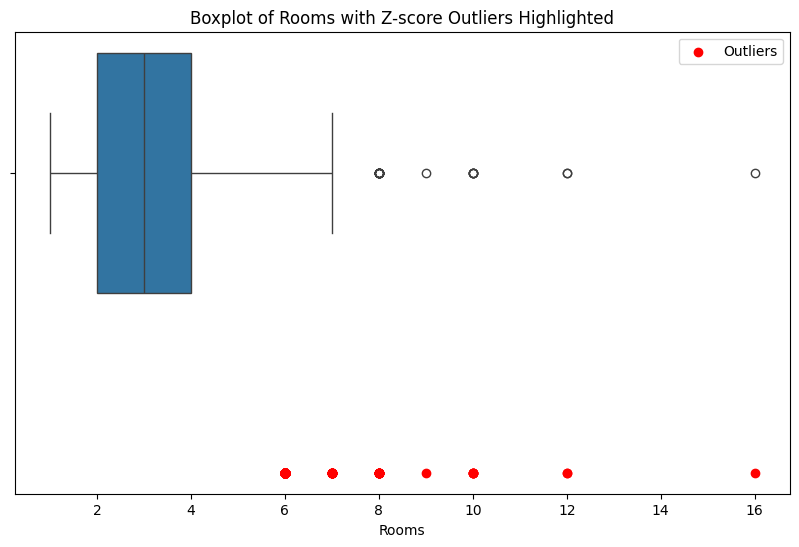

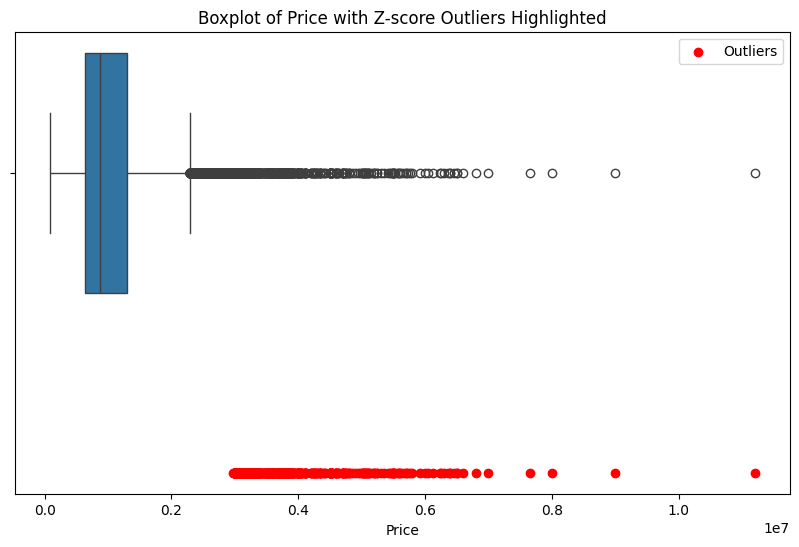

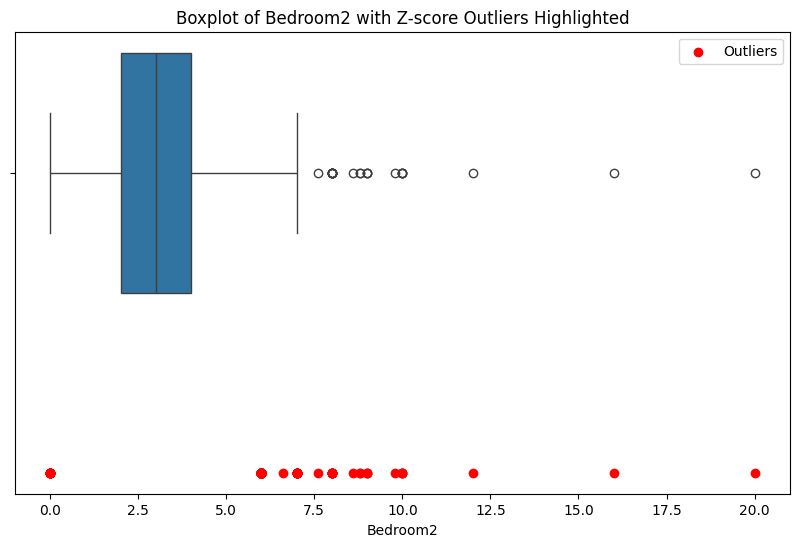

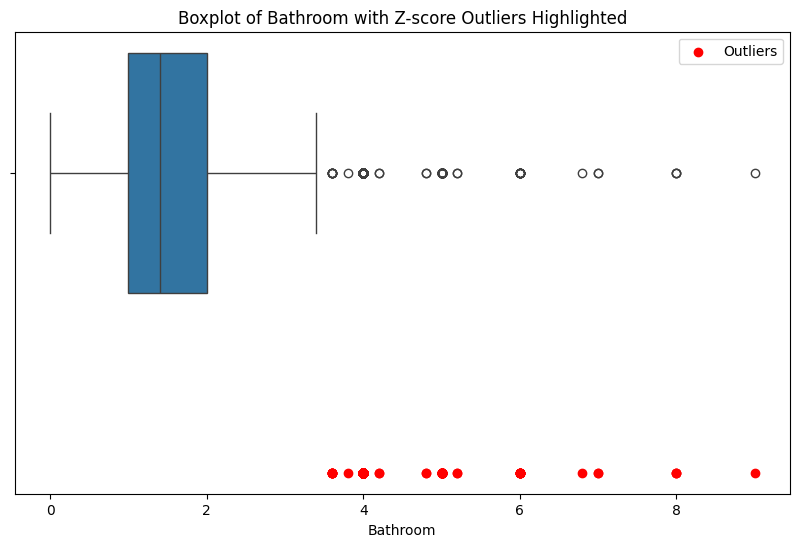

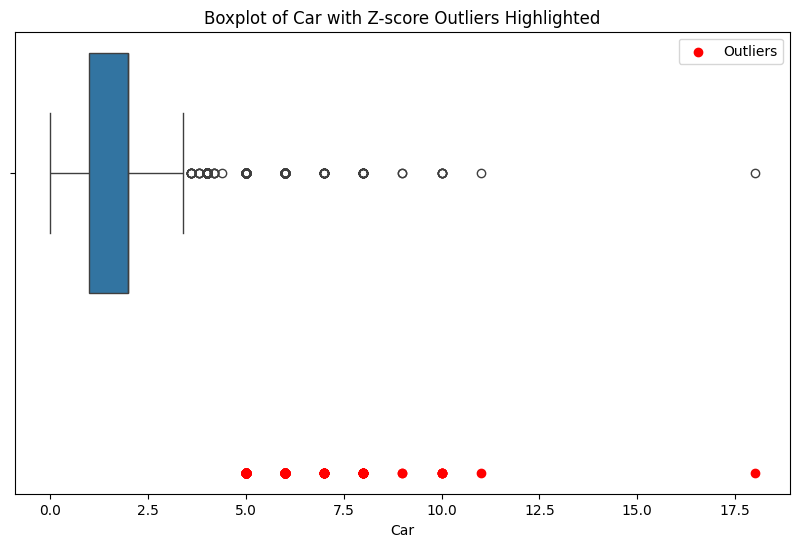

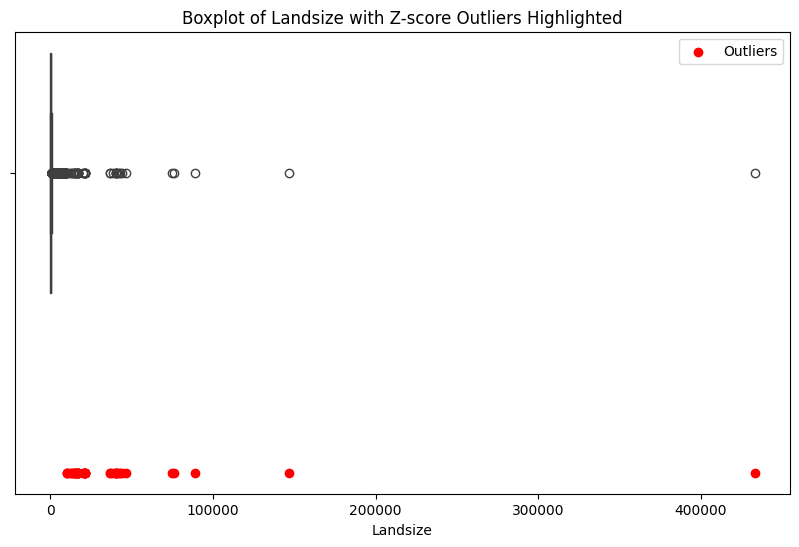

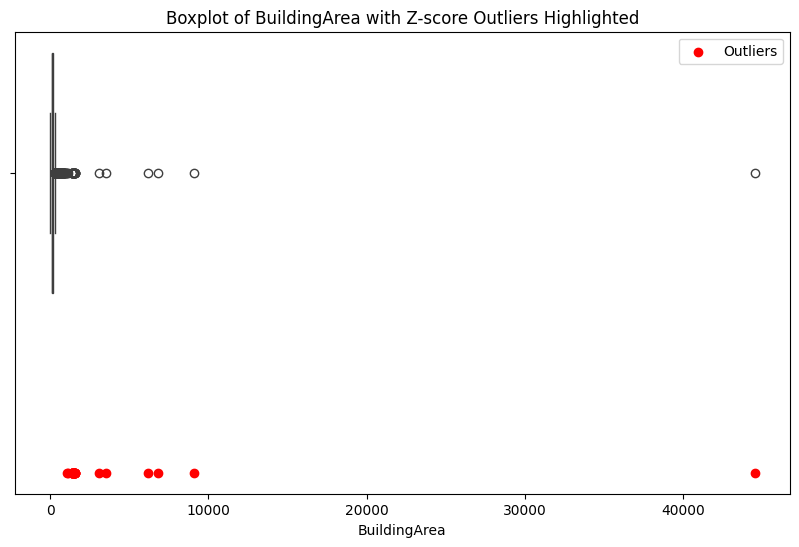

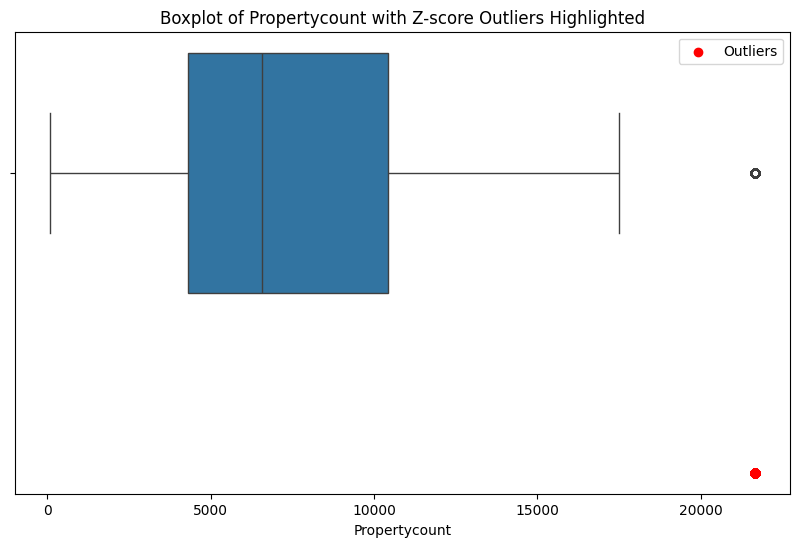

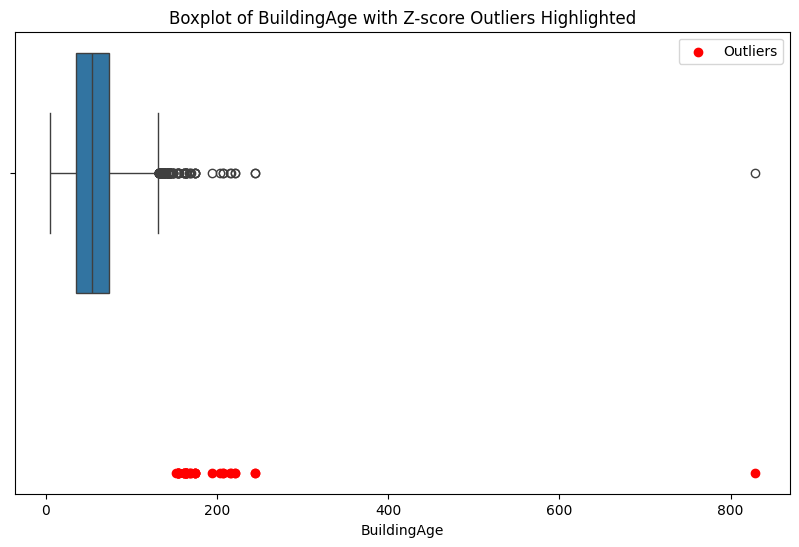

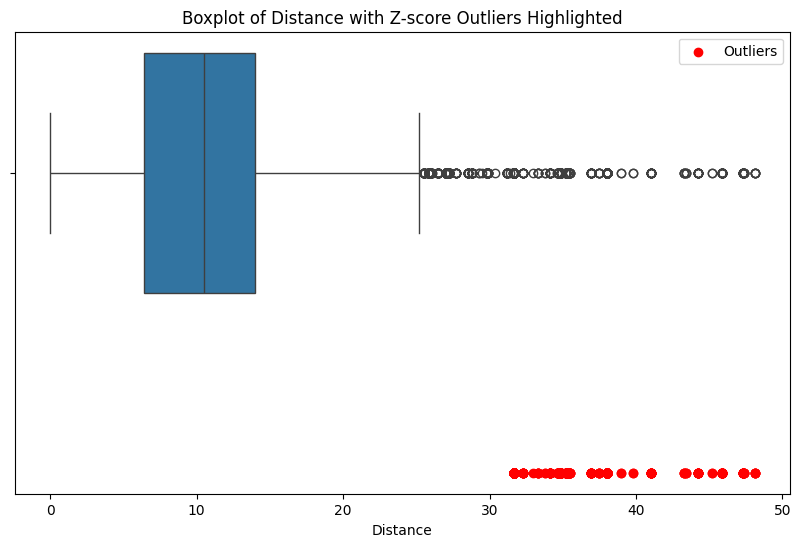

In [33]:
# Boxplot(IQR) and Z-score to detect outlier

# Calculate Z-scores and identify outliers 
for column in columns_to_analyze:
    # Calculate the Z-scores
    mean = df_complete[column].mean()
    std = df_complete[column].std()
    df_complete['Z_score'] = (df_complete[column] - mean) / std
    
    # Identify outliers
    outliers = df_complete[np.abs(df_complete['Z_score']) > 3]
    
    # Plot boxplot with outliers highlighted
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df_complete[column])
    plt.scatter(outliers[column], [1] * len(outliers), color='red', label='Outliers')
    
    plt.title(f'Boxplot of {column} with Z-score Outliers Highlighted')
    plt.legend()
    plt.show()
    
    # Drop the Z_score column after plotting
    df_complete.drop(columns=['Z_score'], inplace=True)


#### Complete dataset - view how much of the portion the outlier take up

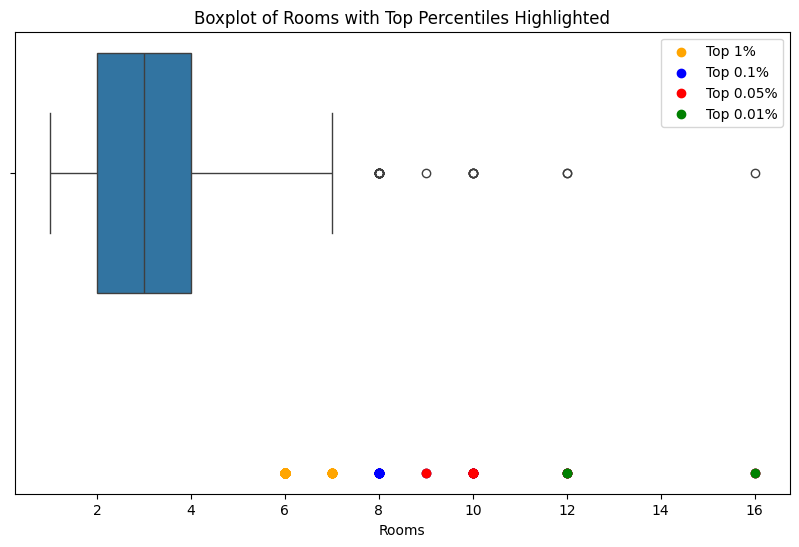

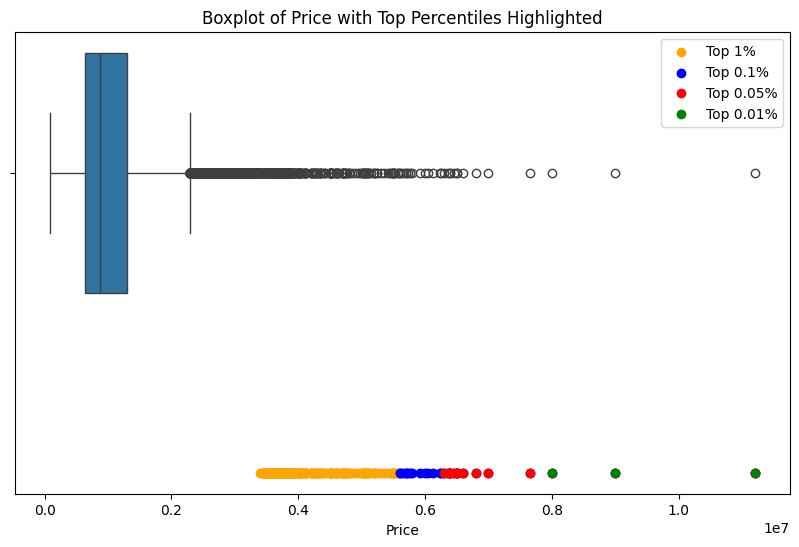

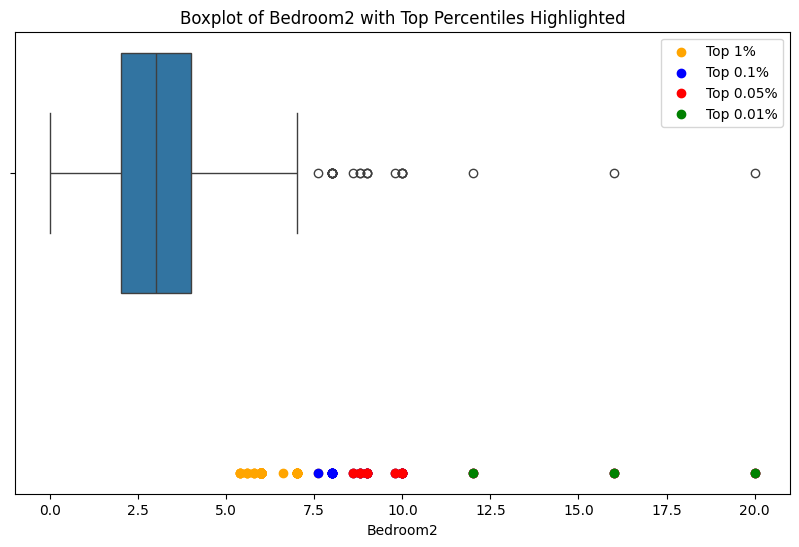

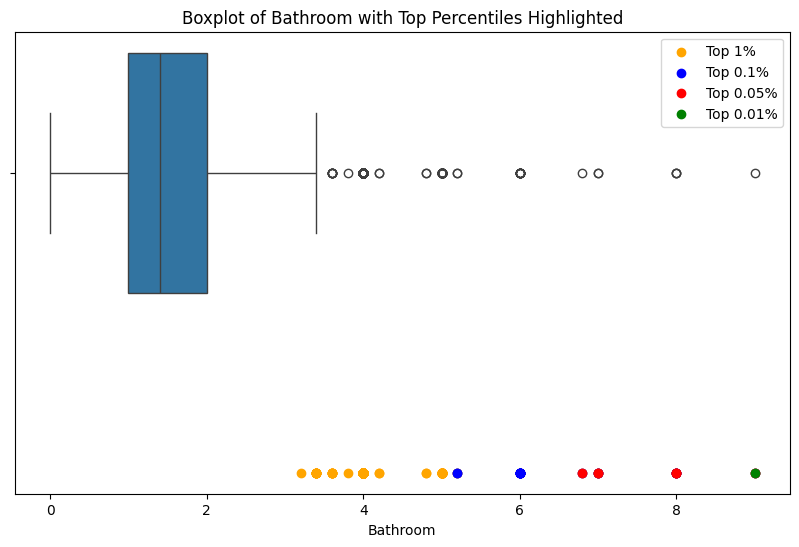

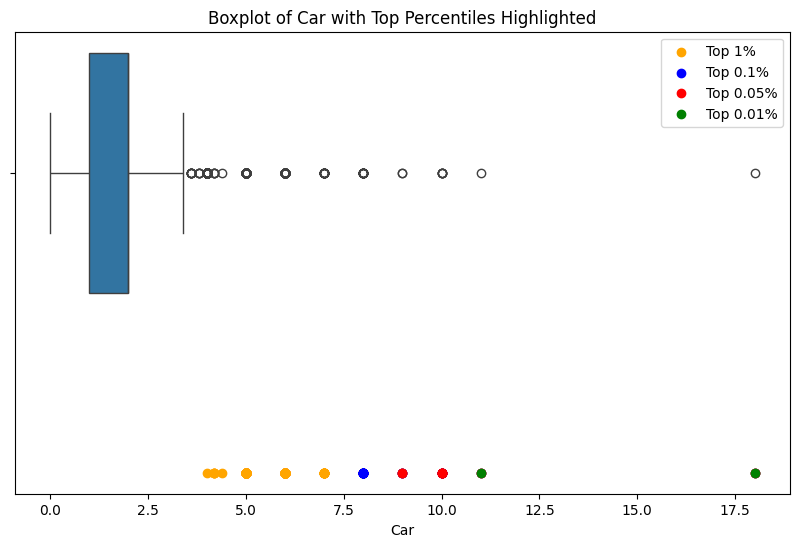

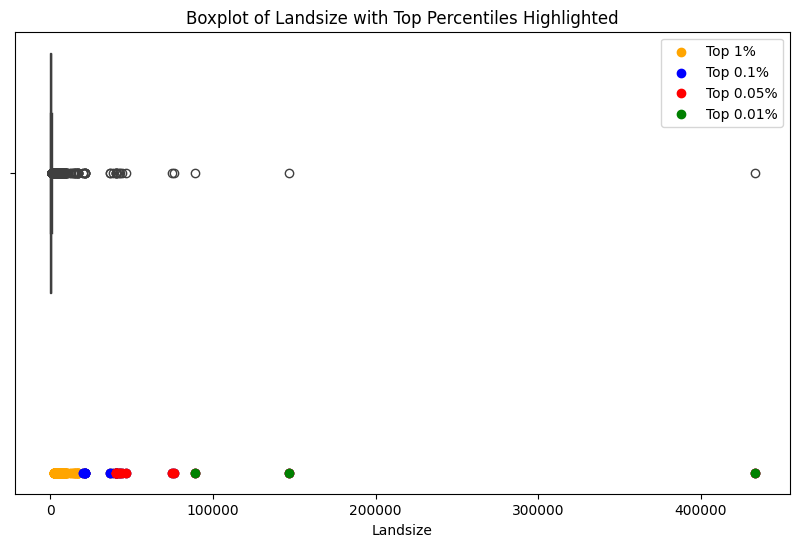

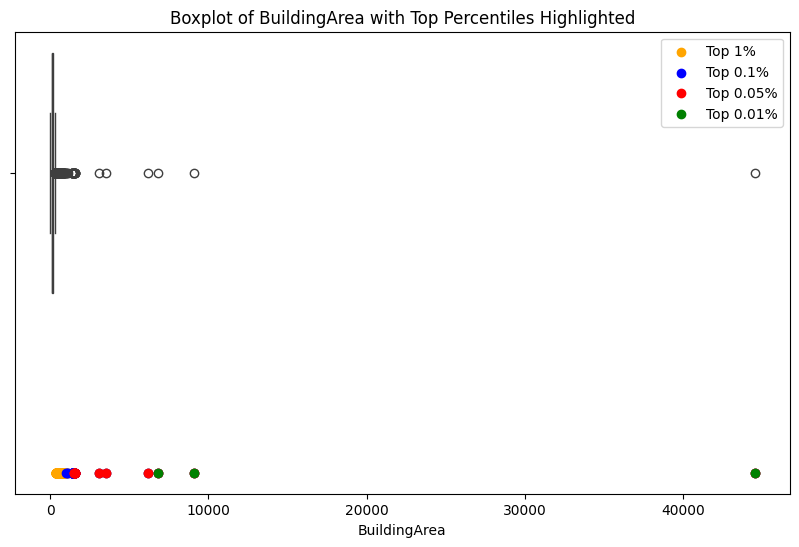

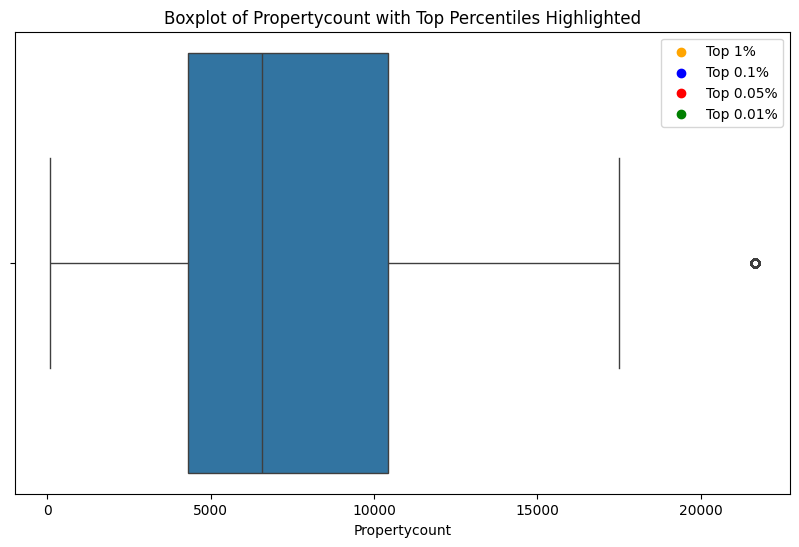

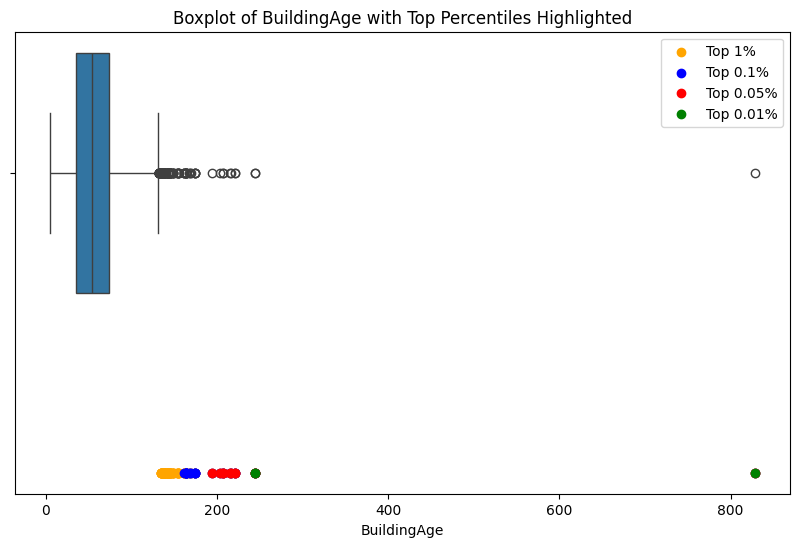

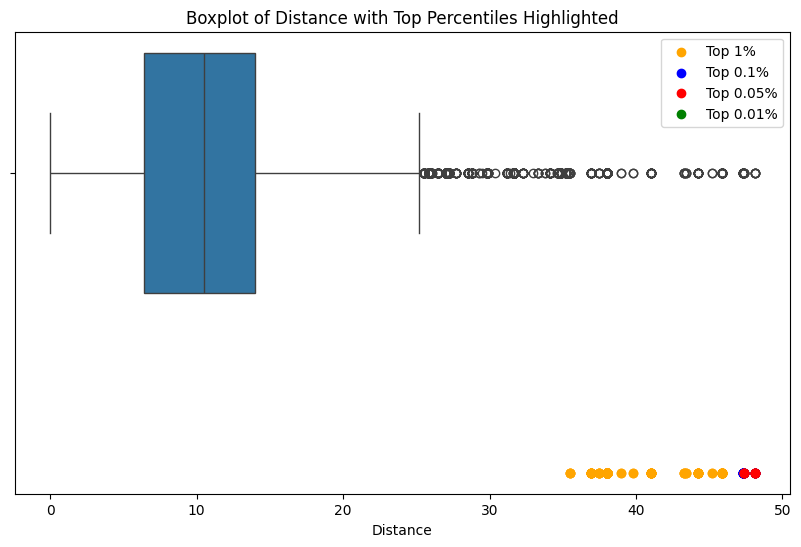

In [34]:
# Plot boxplots with top 1%, 0.1%, and 0.05% highlighted
for column in columns_to_analyze:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df_complete[column])
    
    # Calculate the percentiles
    top_1_percentile = df_complete[column].quantile(0.99)
    top_0_1_percentile = df_complete[column].quantile(0.999)
    top_0_05_percentile = df_complete[column].quantile(0.9995)
    top_0_01_percentile = df_complete[column].quantile(0.9999)
    
    # Highlight the top 1% values
    top_1_values = df_complete[df_complete[column] > top_1_percentile][column]
    plt.scatter(top_1_values, [1] * len(top_1_values), color='orange', label='Top 1%')
    
    # Highlight the top 0.1% values
    top_0_1_values = df_complete[df_complete[column] > top_0_1_percentile][column]
    plt.scatter(top_0_1_values, [1] * len(top_0_1_values), color='blue', label='Top 0.1%')
    
    # Highlight the top 0.05% values
    top_0_05_values = df_complete[df_complete[column] > top_0_05_percentile][column]
    plt.scatter(top_0_05_values, [1] * len(top_0_05_values), color='red', label='Top 0.05%')

    # Highlight the top 0.01% values
    top_0_01_values = df_complete[df_complete[column] > top_0_01_percentile][column]
    plt.scatter(top_0_01_values, [1] * len(top_0_01_values), color='green', label='Top 0.01%')
    
    plt.title(f'Boxplot of {column} with Top Percentiles Highlighted')
    plt.legend()
    plt.show()


Data before filtering out outliers:  (27244, 10)


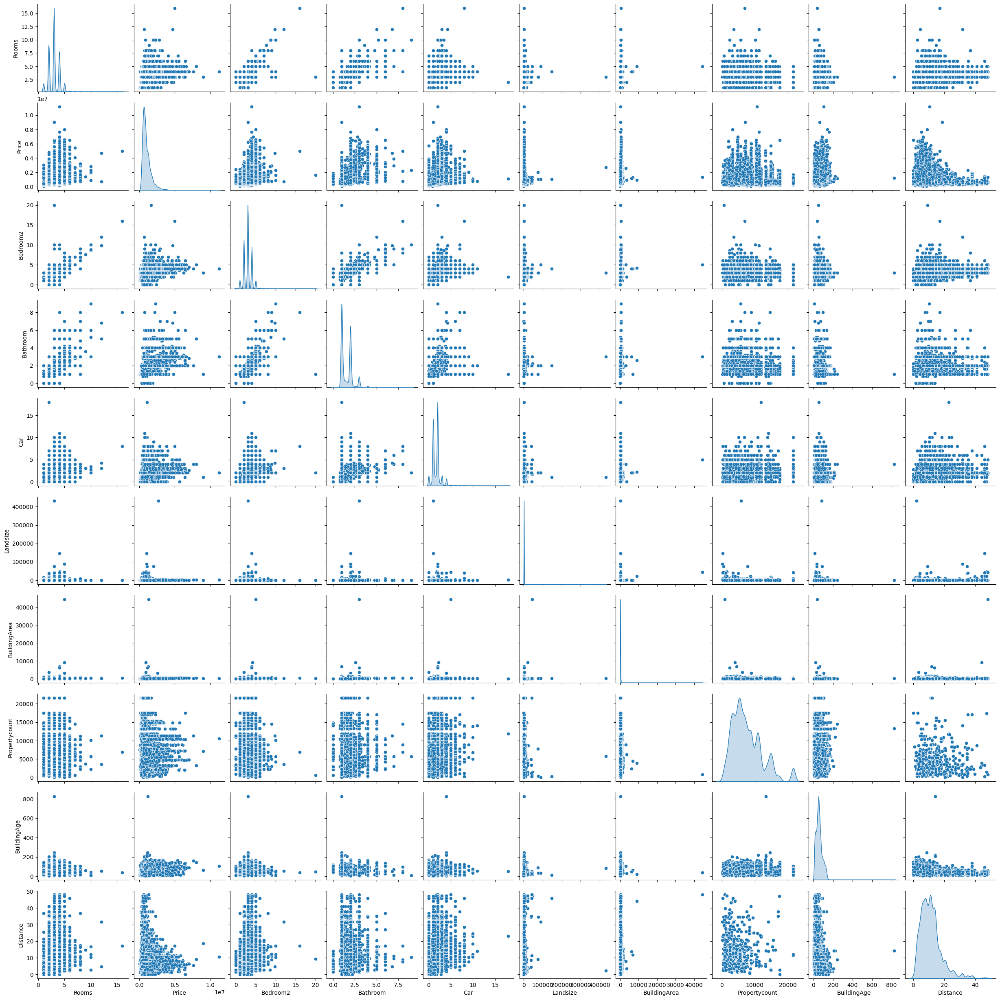

In [35]:
# Create a new DataFrame from df_complete with only the specified columns
df_selected_columns_all = df_complete[columns_to_analyze]

# Check the shape of the new DataFrame
print("Data before filtering out outliers: ", df_selected_columns_all.shape)

sns.pairplot(df_selected_columns_all, diag_kind='kde')
plt.show()

#### After observing the boxplot, I dicide to remove the top 0.05% entries according to price, and see how it effects the pairplot

In [36]:
# Calculate the 99.95th percentile for the 'Price' column
top_0_05_percentile = df_complete['Price'].quantile(0.9995)

# Filter out the top 0.05% of data based on 'Price'
df_filtered = df_complete[df_complete['Price'] <= top_0_05_percentile]

# Check the shape of the DataFrame after removing the top 0.05%
print("Data after removing top 0.05% of prices: ", df_filtered.shape)

Data after removing top 0.05% of prices:  (27230, 18)


#### Use pairplot to check if the pattern is clearer after removing outlier

Data after filtering the outliers:  (27230, 10)


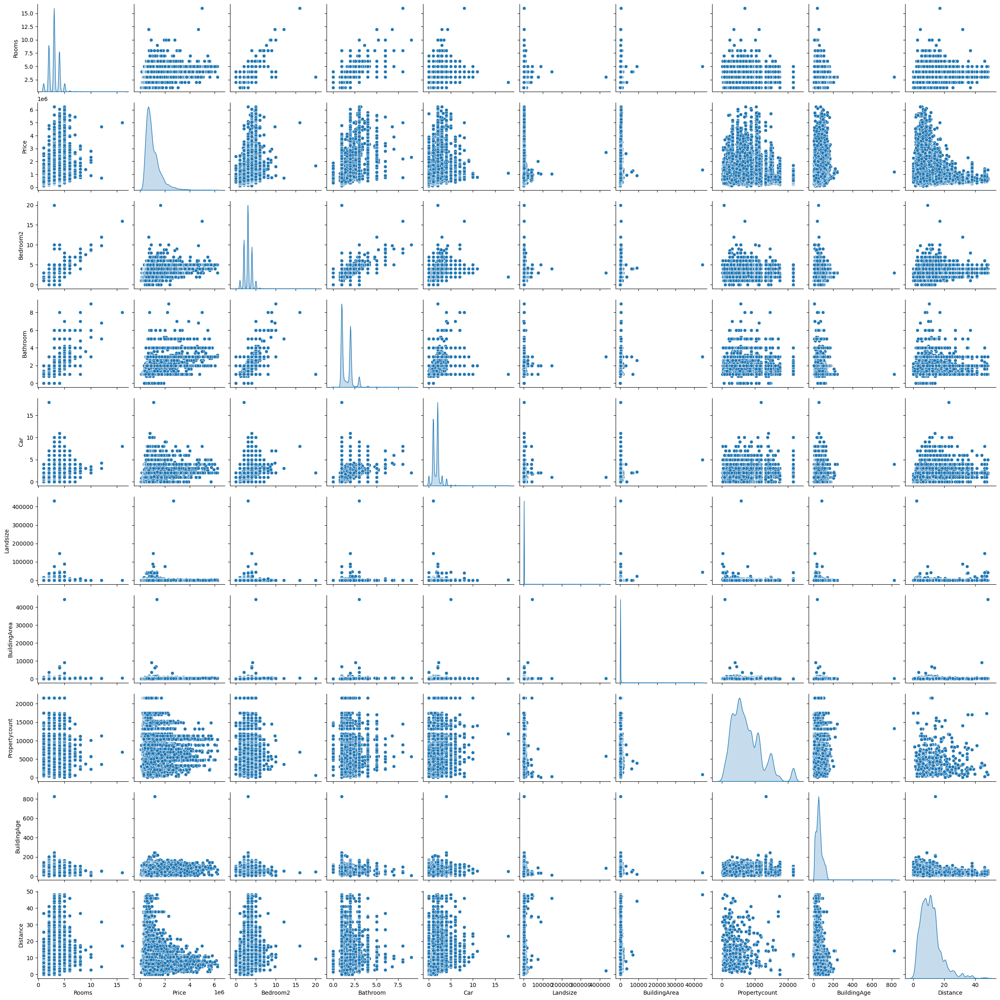

In [37]:
# Create a new DataFrame from df_filtered with only the specified columns
df_selected_columns_filtered = df_filtered[columns_to_analyze]

# Check the shape of the new DataFrame
print("Data after filtering the outliers: ", df_selected_columns_filtered.shape)

sns.pairplot(df_selected_columns_filtered, diag_kind='kde')
plt.show()

The pattern did become much clearer after removing outliers based on price
However, there are some outliers in Landsize, BuildingArea, and other columns.
#### Go further and try removing the top 0.5% of outliers according to BuildingAge

In [38]:
# Calculate the 99.95th percentile for the 'BuildingAge' column
top_0_01_percentile = df_filtered['BuildingAge'].quantile(0.9995)

# Filter out the top 0.05% of data based on 'BuildingAge'
df_filtered = df_filtered[df_filtered['BuildingAge'] <= top_0_01_percentile]

# Check the shape of the DataFrame after removing the top 0.05%
print("Data after removing top 0.01% of BuildingAge: ", df_filtered.shape)

Data after removing top 0.01% of BuildingAge:  (27219, 18)


Data after filtering the outliers:  (27219, 10)


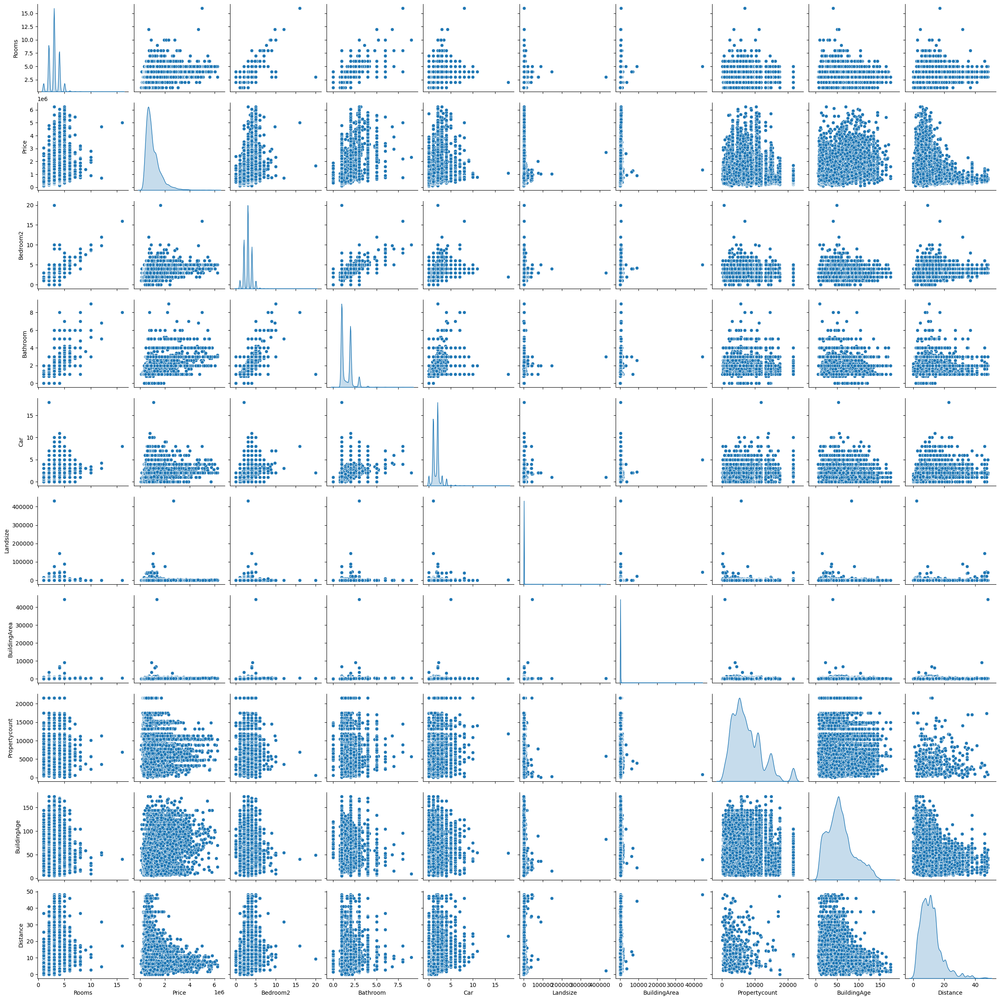

In [39]:
# Create a new DataFrame from df_filtered with only the specified columns
df_selected_columns_filtered = df_filtered[columns_to_analyze]

# Check the shape of the new DataFrame
print("Data after filtering the outliers: ", df_selected_columns_filtered.shape)

sns.pairplot(df_selected_columns_filtered, diag_kind='kde')
plt.show()

Result: The scatter plots related to BuildingAge improved a lot after removing BuildingAge outliers
#### To compare, start over with df_complete, try handling the outliers by looking at the pair plot and manually selecting top values(outliers) to remove

I tried different number combination, checking the boxplot and pair plot for each combination. The folliwing combination is the one I was most satisfied with.

The method I chose ensured that if the top 10 values of Price overlap with the top 10 values of Car, the code will remove the top rows separately based on the sorted Price and Car columns. 

In [40]:
# Create a copy of the DataFrame to avoid modifying the original
df_no_top_outliers = df_complete.copy()

# Remove the top few values for Landsize
df_no_top_outliers = df_no_top_outliers.sort_values(by='Landsize', ascending=False).iloc[200:]

# Remove the top values for BuildingArea
df_no_top_outliers = df_no_top_outliers.sort_values(by='BuildingArea', ascending=False).iloc[100:]

# Remove the top values for BuildingAge
df_no_top_outliers = df_no_top_outliers.sort_values(by='BuildingAge', ascending=False).iloc[50:]

# Remove the top values for Price
df_no_top_outliers = df_no_top_outliers.sort_values(by='Price', ascending=False).iloc[15:]

# Remove the top values for car
df_no_top_outliers = df_no_top_outliers.sort_values(by='Car', ascending=False).iloc[150:]

# Remove the top values for Bedroom2
df_no_top_outliers = df_no_top_outliers.sort_values(by='Bedroom2', ascending=False).iloc[30:]

# # Remove the top values for Propertycount 
# => There is a small cluster that has a super high property count. 
# My goal is to have a model that can predict most of the building price, 
# so that cluster should be dropper to avoid bias
df_no_top_outliers = df_no_top_outliers.sort_values(by='Propertycount', ascending=False).iloc[750:]

# Remove the top values for Bathroom
df_no_top_outliers = df_no_top_outliers.sort_values(by='Bathroom', ascending=False).iloc[70:]


# Check the shape of the DataFrame after removing the top values
print("Data without top outliers: ", df_no_top_outliers.shape)

Data without top outliers:  (25879, 18)


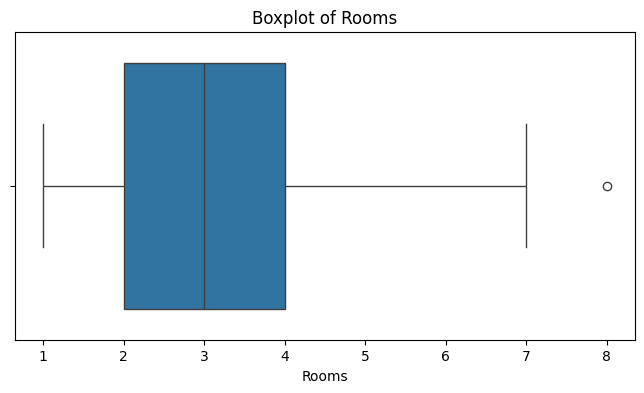

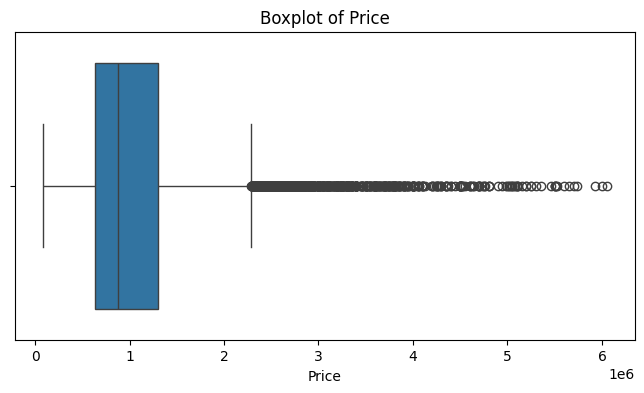

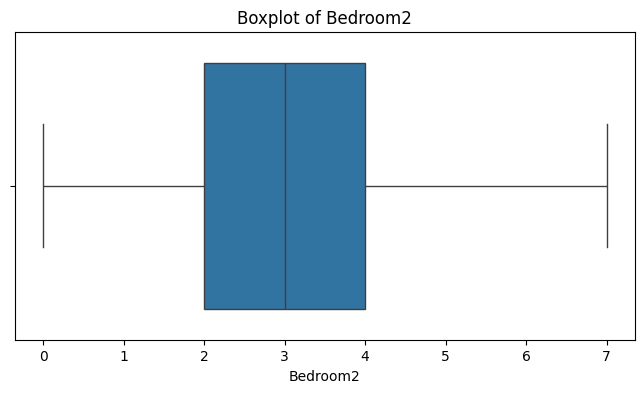

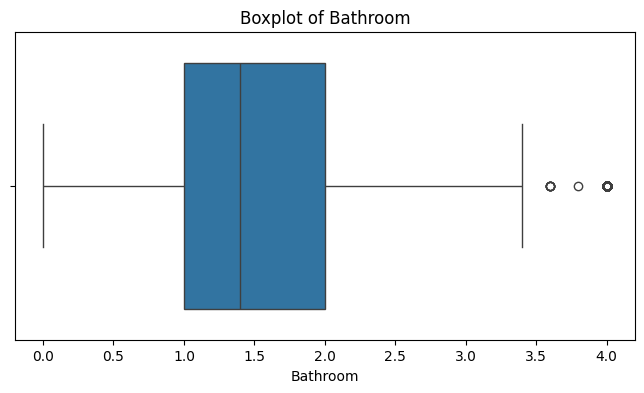

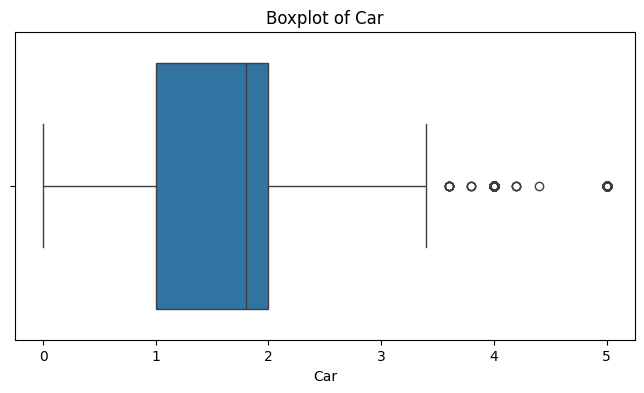

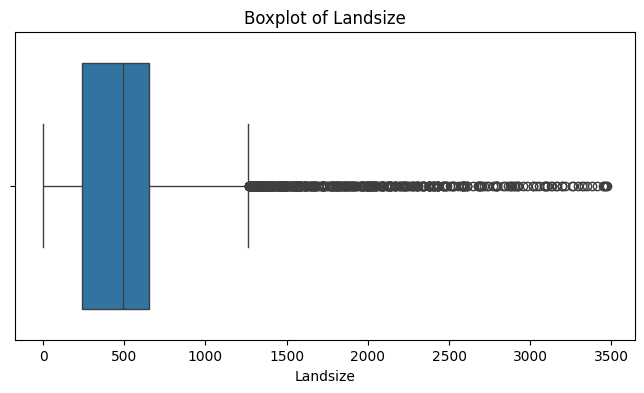

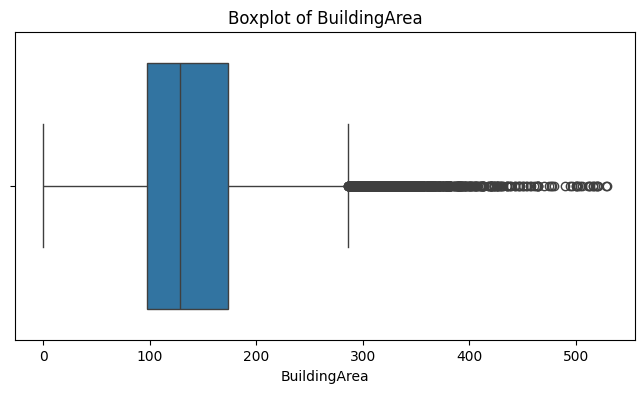

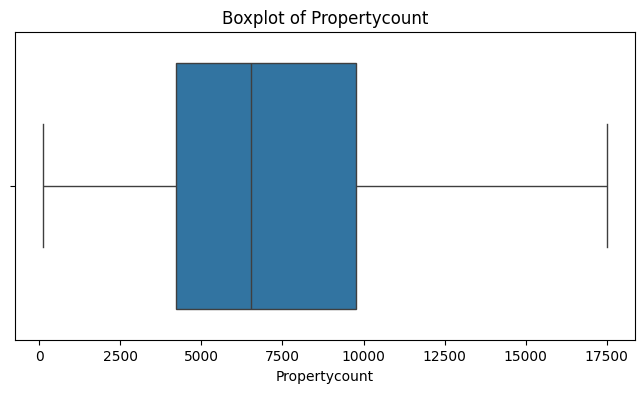

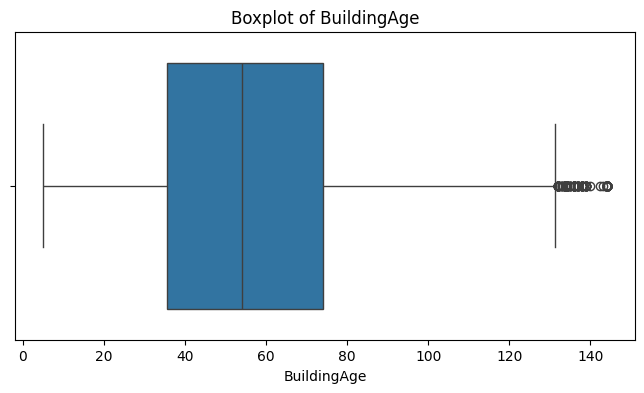

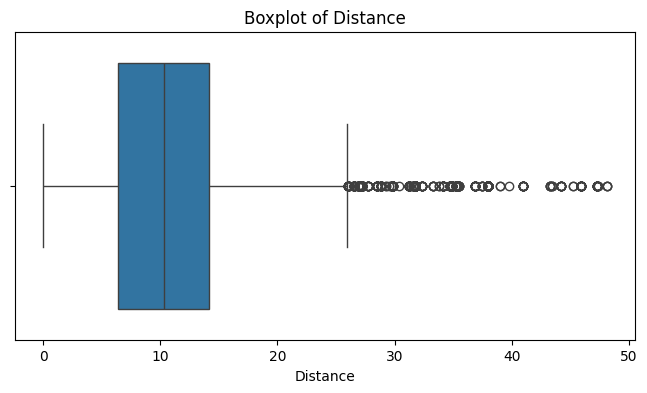

In [41]:
# Boxplot for the numeric features
for col in columns_to_analyze:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df_no_top_outliers[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

Data after filtering the outliers:  (25879, 10)


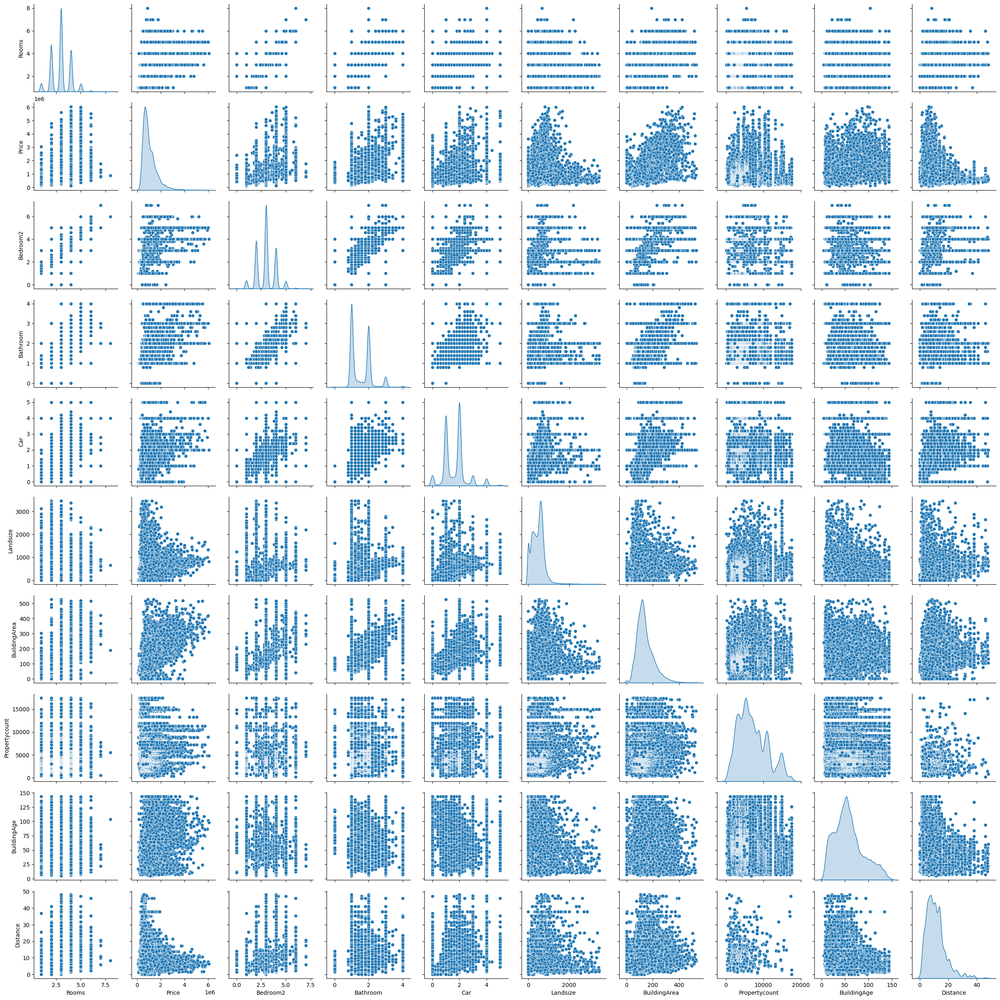

In [42]:
# Create a new DataFrame from df_filtered with only the specified columns
df_selected_columns_filtered = df_no_top_outliers[columns_to_analyze]

# Check the shape of the new DataFrame
print("Data after filtering the outliers: ", df_selected_columns_filtered.shape)

sns.pairplot(df_selected_columns_filtered, diag_kind='kde')
plt.savefig('bathroom landsize.png')
plt.show()

I aim to predict prices accurately for most buildings, so I removed most of the outliers that have an extremely high price, building area, car, etc.
After clearing the outliers, the pattern became much clearer, especially between distance and price.

#### To compare, start over and filter outliers by calculate Multivariate Metrics using Mahalanobis distance

In [43]:
from scipy.spatial.distance import mahalanobis

# Create a DataFrame with the selected columns
df_selected = df_complete[columns_to_analyze]

# Calculate the mean and covariance matrix
mean_vector = df_selected.mean(axis=0)
cov_matrix = np.cov(df_selected.values.T)

# Calculate Mahalanobis distance for each data point
mahalanobis_distances = df_selected.apply(lambda row: mahalanobis(row, mean_vector, np.linalg.inv(cov_matrix)), axis=1)

# Determine a threshold for identifying outliers (e.g., 96th percentile)
# I also tried 97, 98, and 99, I think 96 is the best after observing the pair plot
threshold = np.percentile(mahalanobis_distances, 96)

# Identify outliers
outliers = df_selected[mahalanobis_distances > threshold]

# Filter out the outliers
df_no_outliers = df_selected[mahalanobis_distances <= threshold]

# Check the shape of the DataFrame after removing outliers
print("Data without multivariate outliers: ", df_no_outliers.shape)

Data without multivariate outliers:  (26154, 10)


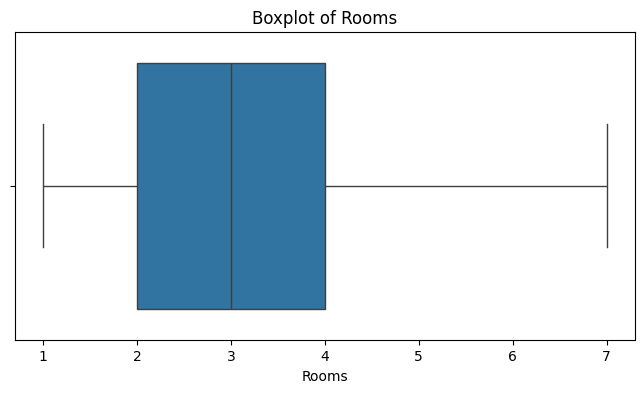

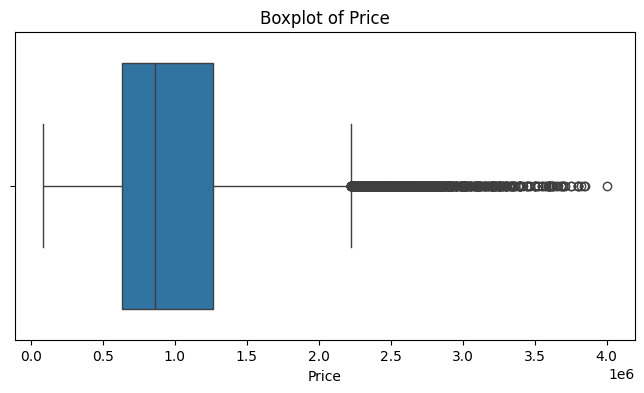

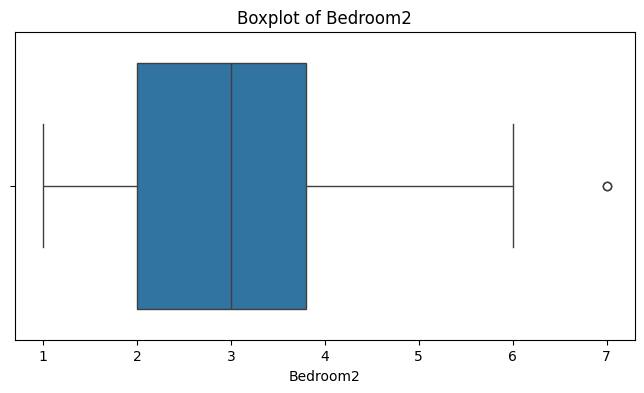

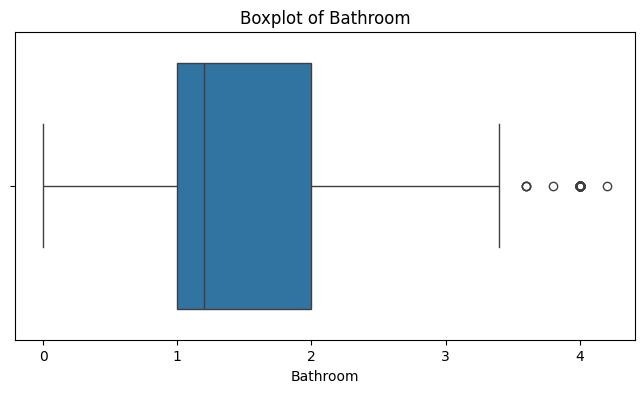

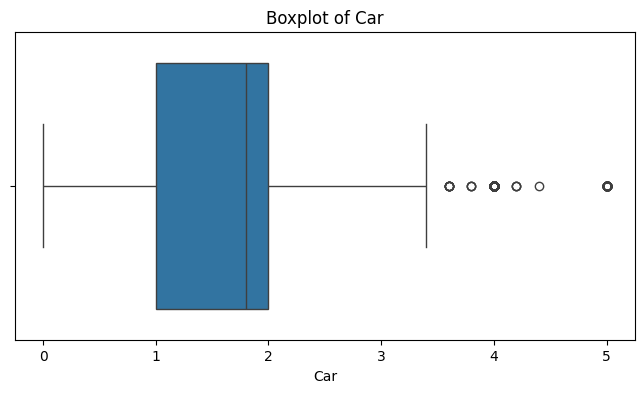

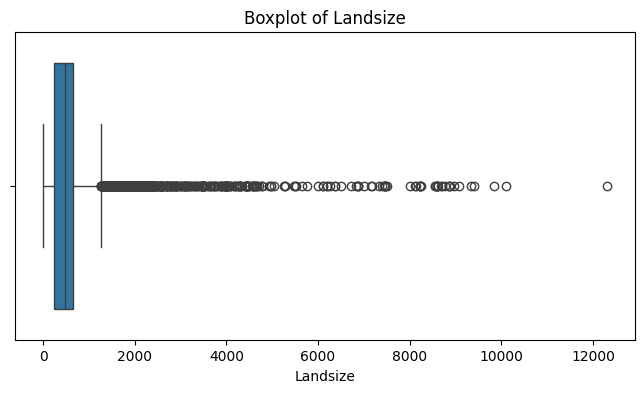

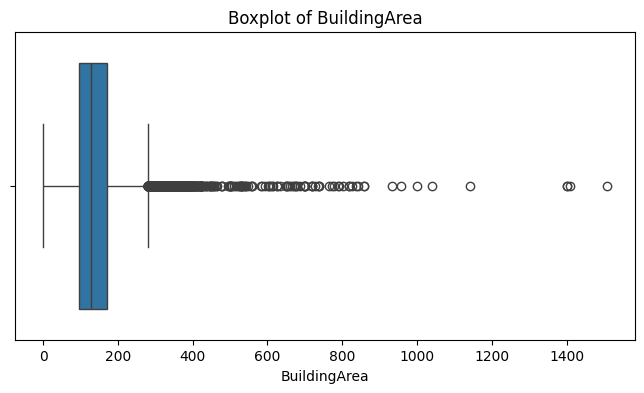

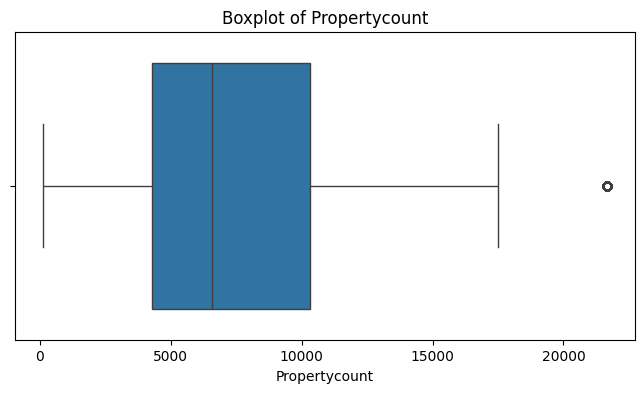

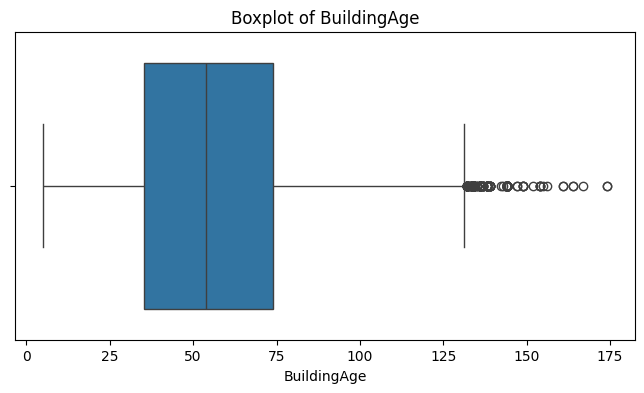

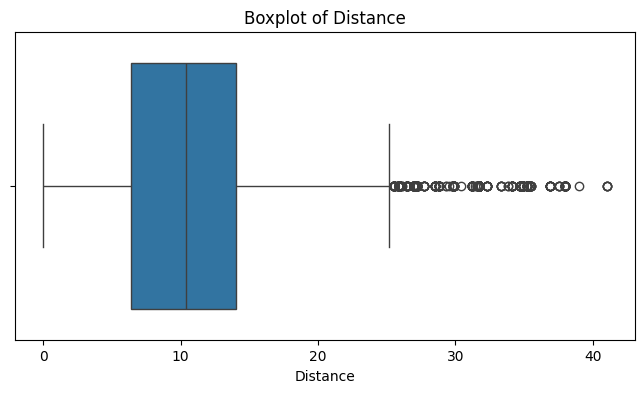

In [44]:
# Boxplot for the numeric features
for col in columns_to_analyze:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df_no_outliers[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

Data after filtering the outliers with Mahalanobis distance:  (26154, 10)


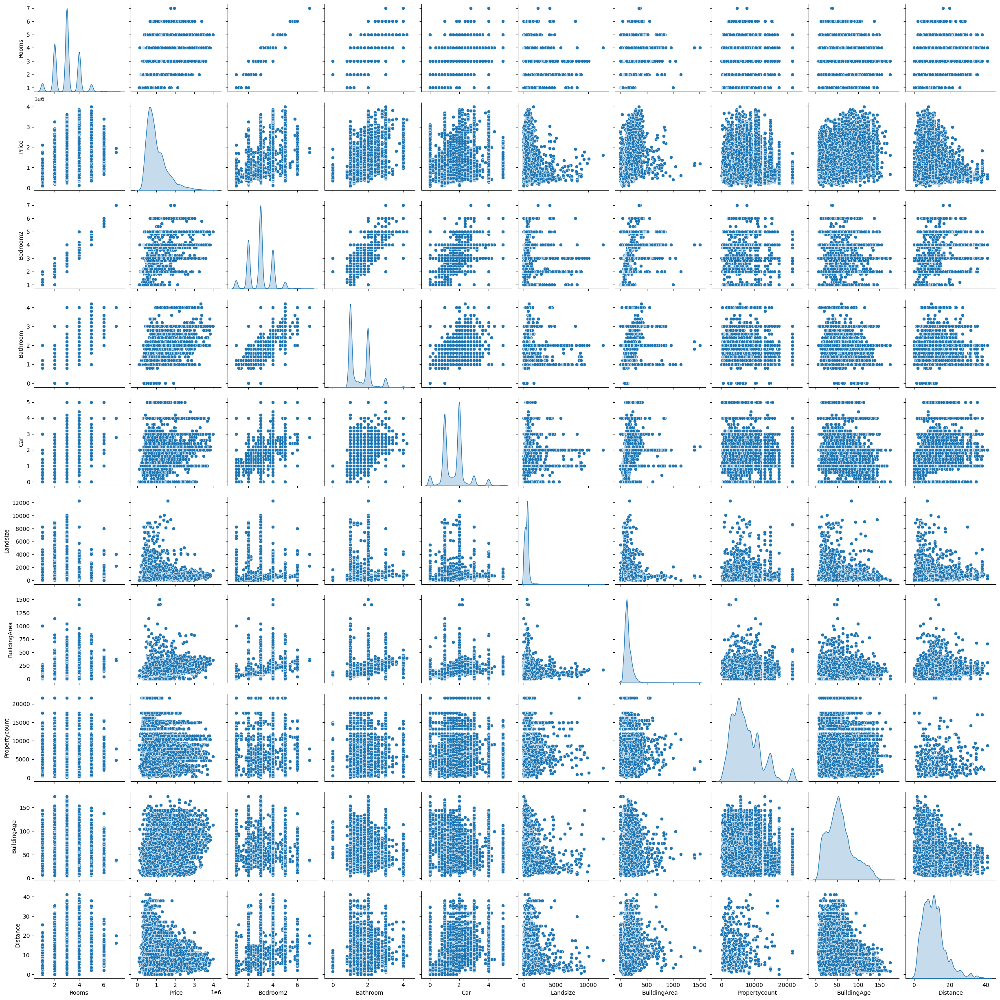

In [45]:
# Check the shape of the DataFrame
print("Data after filtering the outliers with Mahalanobis distance: ", df_no_outliers.shape)

sns.pairplot(df_no_outliers, diag_kind='kde')
plt.savefig('bathroom landsize.png')
plt.show()

After comparing the pair plot of the dataset that has the outlier manually removed(df_no_top_outliers) and the dataset that uses Mahalanobis distance to remove outliers(df_no_outliers), I think the pattern in df_no_top_outliers is slightly clearer, therefore I am going to build the linear model based on it.

In [46]:
# For easy reference
df3 = df_no_top_outliers

# check to shape
print(df_no_top_outliers.shape)
print(df3.shape)

(25879, 18)
(25879, 18)


# Implement Linear Regression Models and Model Evaluation
Goal: Use linear regression models to predict the price, and find the best model by evaluating the model.

- Plan various linier models
    - Start from one column (feature) per model (i.e., 𝑦= 𝑚𝑥 +𝑏)
    - Document each model
    - Note: Create multiple regression model if possible
- Evaluate the Models in terms of their performance
    - Pearson Correlation Coefficients (r)
    - Manual Analysis of Predictions
        - Plot the regression lines with scatterplots. 


In [47]:
# Import needed package and library
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import pearsonr

#### Train the model with only one feature
Numerical features

In [48]:
df3 = df_no_top_outliers

In [49]:
# Define target variable (y)
y = df3['Price']

Single Feature Model ('Rooms')
Mean Squared Error: 301551491879.825
R-squared: 0.20077501351935367
Pearson Correlation Coefficient (r): 0.4619174475298011



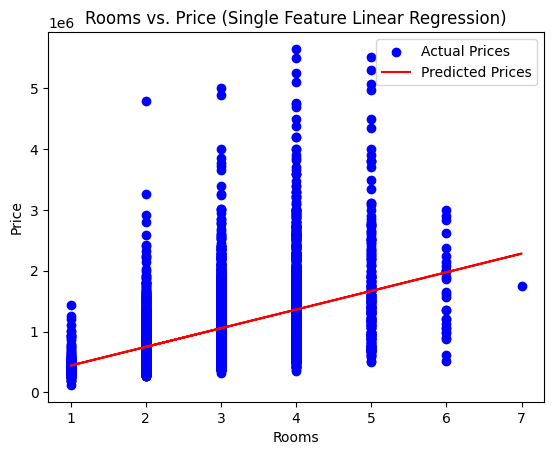

In [50]:
# Define the feature to be used
feature = 'Rooms' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Room and price are moderately positively related. From the scatter plot, they might have a higher correlation if I excluded more outliers in 'Price' before training the model.

Single Feature Model ('Bedroom2')
Mean Squared Error: 304363049777.42706
R-squared: 0.19332332654976625
Pearson Correlation Coefficient (r): 0.45375647960086385



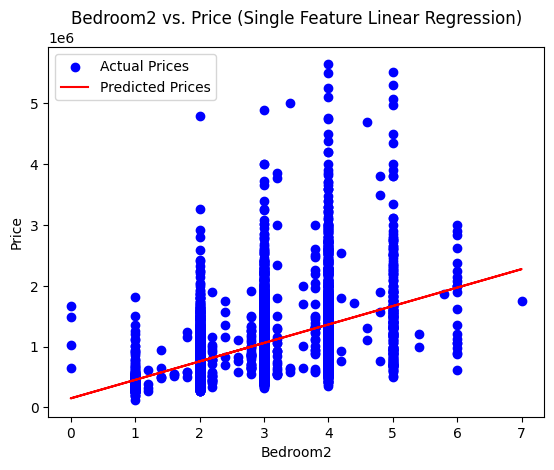

In [51]:
# Define the feature to be used
feature = 'Bedroom2' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Bedroom2 is similar to Room, it is also moderately positively related to Price. From the scatter plot, they might have a higher correlation if I excluded more outliers in 'Price' before training the model.

Single Feature Model ('Bathroom')
Mean Squared Error: 307603315346.51086
R-squared: 0.18473540284393108
Pearson Correlation Coefficient (r): 0.4420981907486701



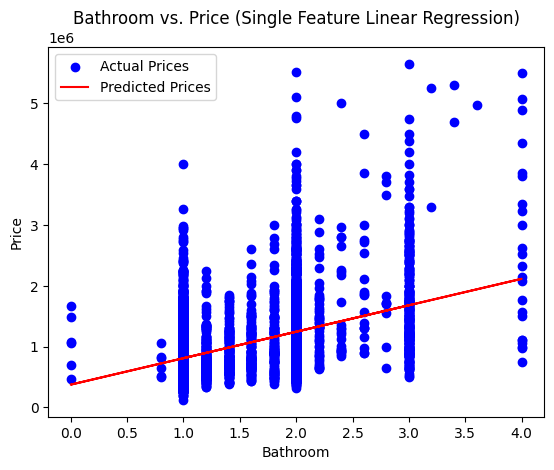

In [52]:
# Define the feature to be used
feature = 'Bathroom' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Bathroom and price are moderately positively related. From the scatter plot, I can't tell if the correlation between Bathroom and Price will be stronger if I excluded more outliers in 'Price' before training the model.

Single Feature Model ('Car')
Mean Squared Error: 360533965963.0824
R-squared: 0.044449250519736694
Pearson Correlation Coefficient (r): 0.23547638597977857



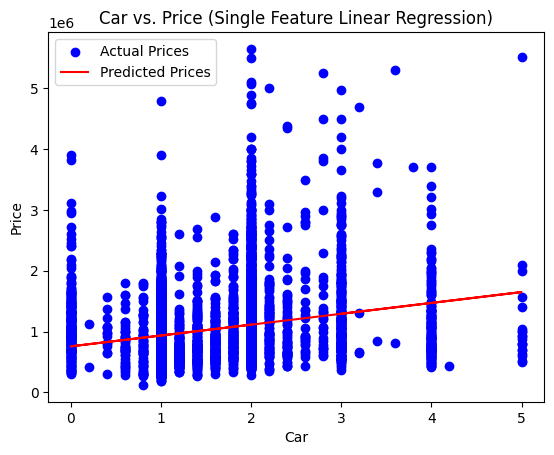

In [53]:
# Define the feature to be used
feature = 'Car' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Number of car spots is positively corelated to price, but the correlation is not strong. Even for the more expensive houses, the common number of car spots seems to be 2 or 3.

Single Feature Model ('Landsize')
Mean Squared Error: 363911910662.59894
R-squared: 0.03549642528258157
Pearson Correlation Coefficient (r): 0.20634518147522926



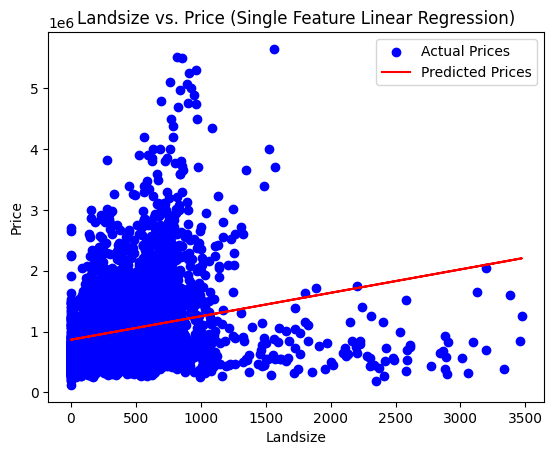

In [54]:
# Define the feature to be used
feature = 'Landsize' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Land size is related to Price but they don't have a strong correlation. Excluding more outliers of Price or Landsize might improve this. And the weak correlation might be because there are two big groups of houses mixed: expensive houses that are especially large, and houses that have a huge yard but aren't super expensive.

Single Feature Model ('BuildingArea')
Mean Squared Error: 255140450292.5624
R-squared: 0.3237817473076746
Pearson Correlation Coefficient (r): 0.5793669739752213



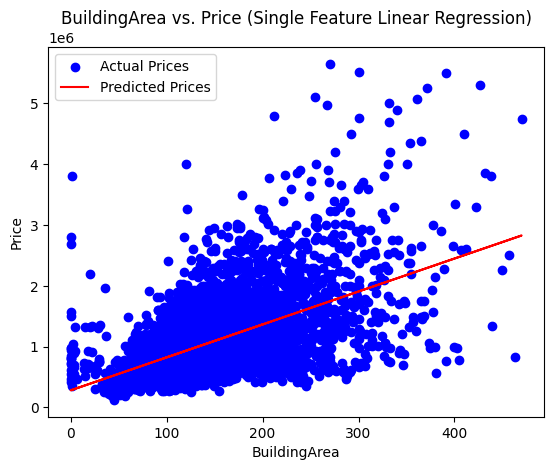

In [55]:
# Define the feature to be used
feature = 'BuildingArea' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Building area have a moderate positive correlation. Generally, the more you pay, the more building area you get.

Single Feature Model ('Propertycount')
Mean Squared Error: 377293656166.2168
R-squared: 2.9761521293969473e-05
Pearson Correlation Coefficient (r): -0.012019094123853609



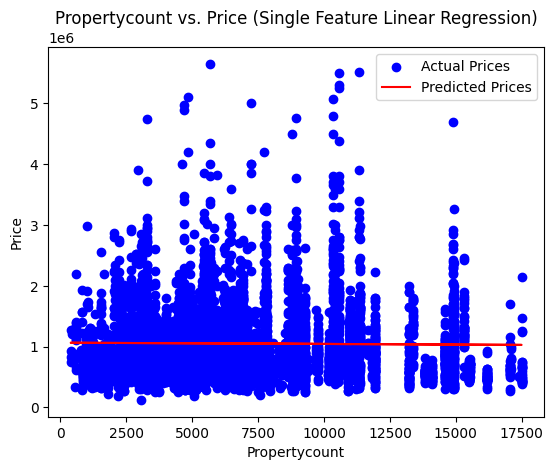

In [56]:
# Define the feature to be used
feature = 'Propertycount' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Property count(Number of properties that exist in the suburb) has almost no effect on price.

Single Feature Model ('BuildingAge')
Mean Squared Error: 317816091495.49963
R-squared: 0.15766770097741778
Pearson Correlation Coefficient (r): 0.3924824801195315



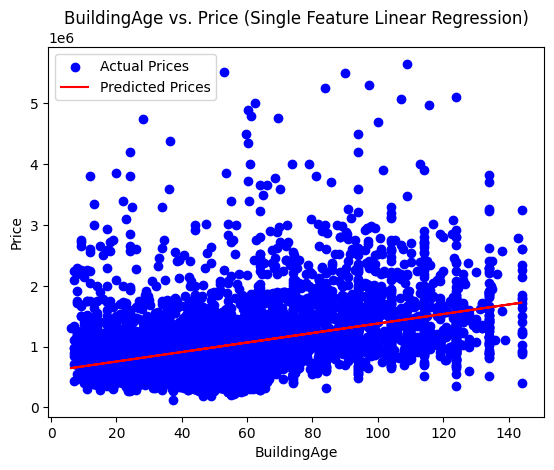

In [57]:
# Define the feature to be used
feature = 'BuildingAge' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


Building age and price is positively related, but they don't have a strong correlation. The trend is that the price goes up if a builing is older. But for the same price, the chart shows that you can buy a building that ranges from 10 to 140 years old. 

Single Feature Model ('Distance')
Mean Squared Error: 357259631120.1994
R-squared: 0.05312747062809264
Pearson Correlation Coefficient (r): -0.22147622821132026



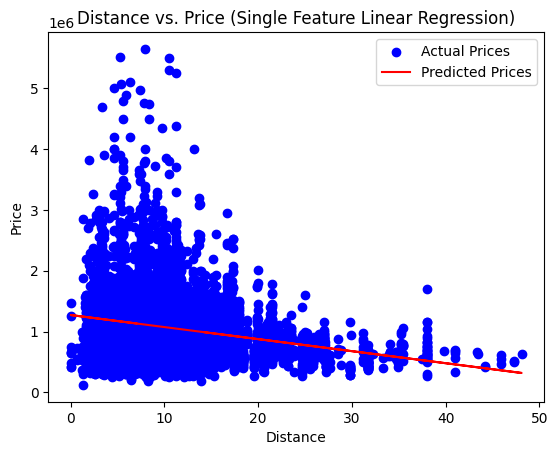

In [58]:
# Define the feature to be used
feature = 'Distance' 

# Use the feature variable dynamically in your code
X_single = df3[[feature]]

# Split data into training and testing sets
X_train_single, X_test_single, y_train, y_test = train_test_split(X_single, y, test_size=0.2, random_state=42)

# Train the model on the single feature
model_single = LinearRegression()
model_single.fit(X_train_single, y_train)

# Make predictions and evaluate the model
y_pred_single = model_single.predict(X_test_single)
mse_single = mean_squared_error(y_test, y_pred_single)
r2_single = r2_score(y_test, y_pred_single)

# Compute Pearson Correlation Coefficient
pearson_corr, _ = pearsonr(df3[feature], y)  # Pearson correlation between feature and target

# Print evaluation results
print(f"Single Feature Model ('{feature}')")
print(f"Mean Squared Error: {mse_single}")
print(f"R-squared: {r2_single}")
print(f"Pearson Correlation Coefficient (r): {pearson_corr}\n")

# Scatter plot for Single Feature Model
plt.scatter(X_test_single, y_test, color='blue', label='Actual Prices')  # Actual data
plt.plot(X_test_single, y_pred_single, color='red', label='Predicted Prices')  # Regression line
plt.xlabel(feature)
plt.ylabel('Price')
plt.title(f'{feature} vs. Price (Single Feature Linear Regression)')
plt.legend()
plt.show()


According to Pearson Correlation Coefficients, Distance and Price have a  weakly negative correlation. But looking at the scatter plot, these two columns have a strong correlation, but it is more like a curve. The closer the building is to CBD, the more expensive it is. The most expensive buildings are those that are 5 to 15 Kilometers from CBD.

#### Train the model with multiple features

In [59]:

def run_multiple_linear_regression(features, df=df3, target='Price'):
    # Standardize the features
    scaler = StandardScaler()
    X = df[features]
    X_scaled = scaler.fit_transform(X)
    y = df[target]
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
    
    # Train the model
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    # Make predictions and evaluate the model
    y_pred_scaled = model.predict(X_test)
    
    # Transform predictions back to original scale
    X_test_original = scaler.inverse_transform(X_test)
    X_train_original = scaler.inverse_transform(X_train)
    
    # Create a DataFrame for easier plotting
    df_test = pd.DataFrame(X_test_original, columns=features)
    df_test[target] = y_test
    df_test['Predicted'] = y_pred_scaled
    
    mse = mean_squared_error(y_test, y_pred_scaled)
    r2 = r2_score(y_test, y_pred_scaled)
    
    # Compute Pearson Correlation Coefficient for each feature
    pearson_corrs = {feature: pearsonr(df[feature], y)[0] for feature in features}
    
    # Print evaluation results
    print(f"Multiple Linear Regression Model")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    for feature, corr in pearson_corrs.items():
        print(f"Pearson Correlation Coefficient (r) for {feature}: {corr}")
    
    # Visualize the results
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred_scaled, color='blue', label='Predicted vs Actual')
    plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', lw=2, label='Ideal Fit')
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    plt.title('Actual vs Predicted Prices')
    plt.legend()
    plt.show()
    
    # Residual plot
    residuals = y_test - y_pred_scaled
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True, color='purple')
    plt.xlabel('Residuals')
    plt.title('Residuals Distribution')
    plt.show()
    
    # Feature importance
    feature_importance = pd.Series(model.coef_, index=features).sort_values(ascending=False)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=feature_importance, y=feature_importance.index, hue=feature_importance.index, palette='viridis', dodge=False, legend=False)
    plt.xlabel('Coefficient Value')
    plt.title('Feature Importance')
    plt.show()

Multiple Linear Regression Model
Mean Squared Error: 248592759657.8299
R-squared: 0.34113559267053906
Pearson Correlation Coefficient (r) for Rooms: 0.4619174475298011
Pearson Correlation Coefficient (r) for Distance: -0.22147622821132026


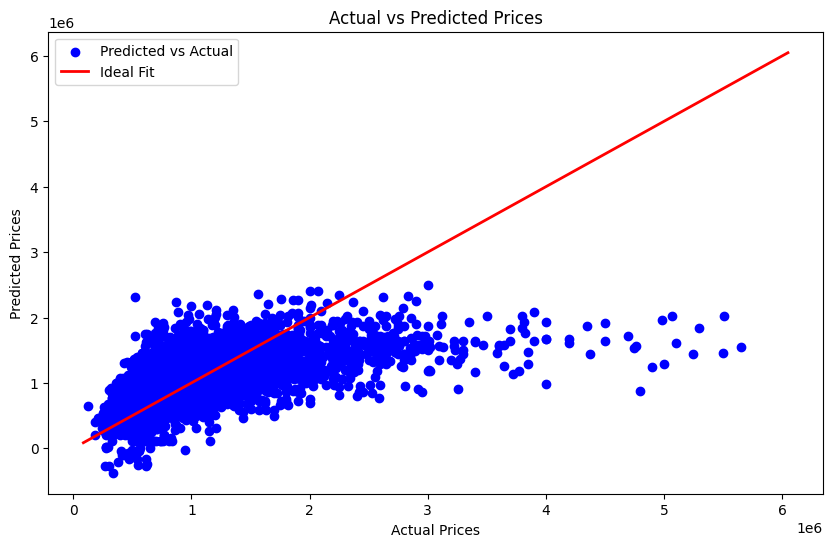

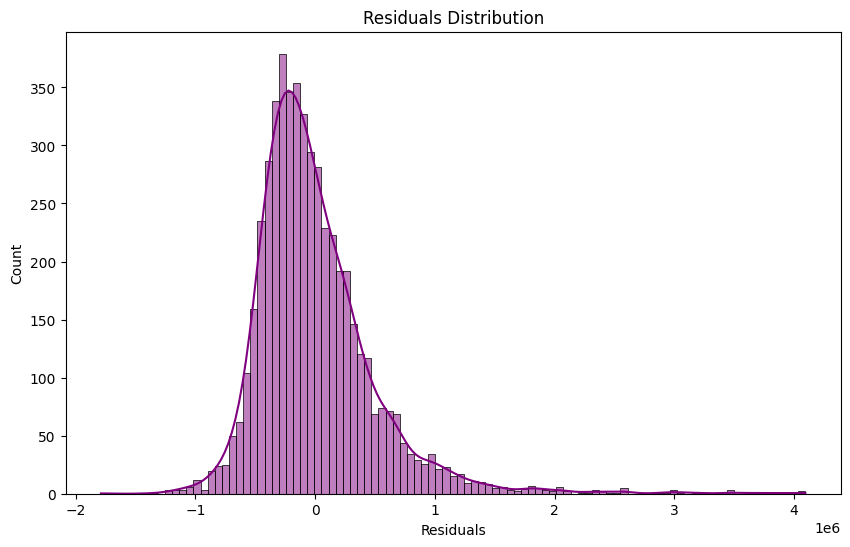

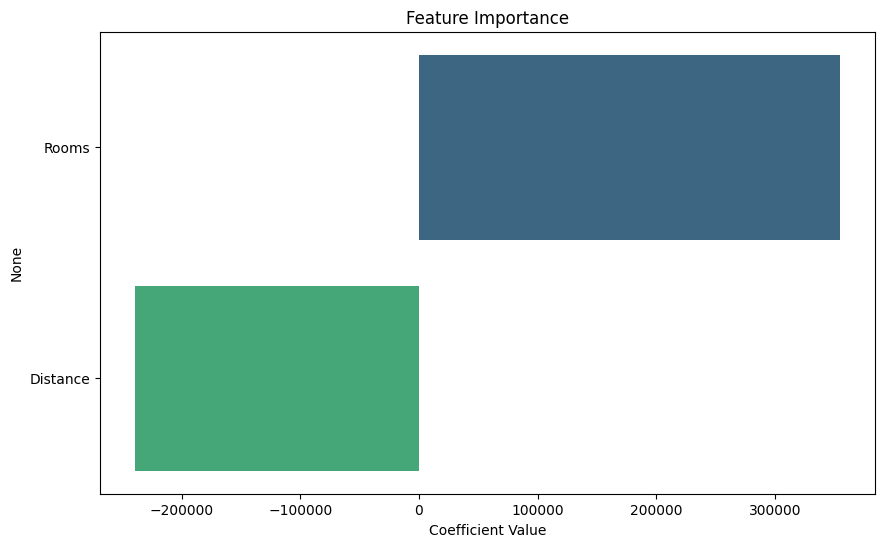

In [60]:
features = ['Rooms', 'Distance'] 
run_multiple_linear_regression(features)

According to R-square, Rooms and Distance combined can explain 34% of Price. This is much better than Distance on its own(5%) or Room on its own(20%)

Multiple Linear Regression Model
Mean Squared Error: 167255555376.55627
R-squared: 0.5567098071664869
Pearson Correlation Coefficient (r) for Distance: -0.22147622821132026
Pearson Correlation Coefficient (r) for BuildingArea: 0.5793669739752213
Pearson Correlation Coefficient (r) for BuildingAge: 0.3924824801195315


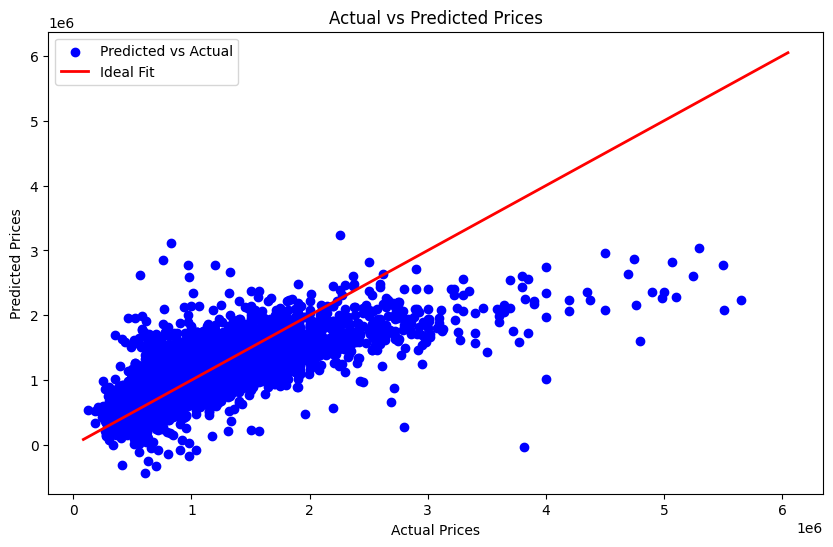

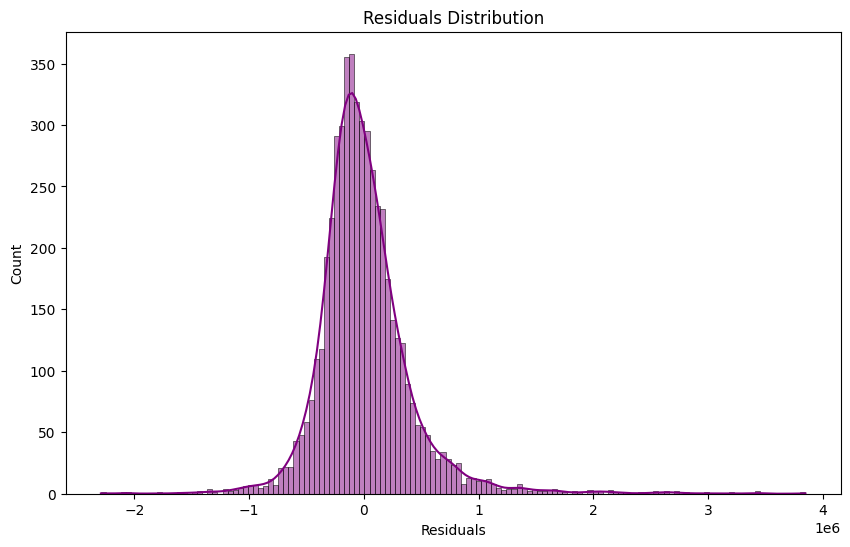

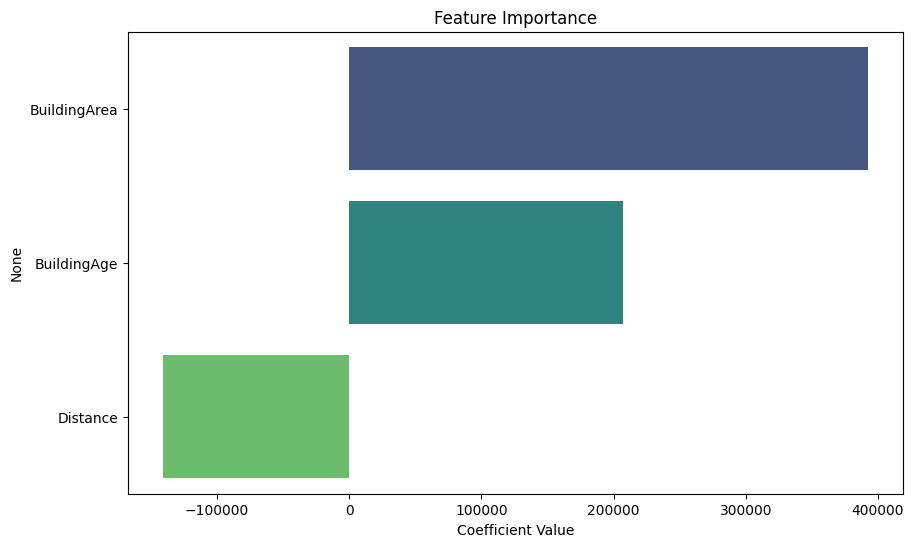

In [61]:
features = ['Distance', 'BuildingArea', 'BuildingAge'] 
run_multiple_linear_regression(features)

'Distance', 'BuildingArea', and 'BuildingAge' combined can account for 56% of the Price, which is a big improvement over just using one feature for the model.

Multiple Linear Regression Model
Mean Squared Error: 171837264607.37708
R-squared: 0.5445665527085706
Pearson Correlation Coefficient (r) for Bathroom: 0.4420981907486701
Pearson Correlation Coefficient (r) for BuildingArea: 0.5793669739752213
Pearson Correlation Coefficient (r) for BuildingAge: 0.3924824801195315


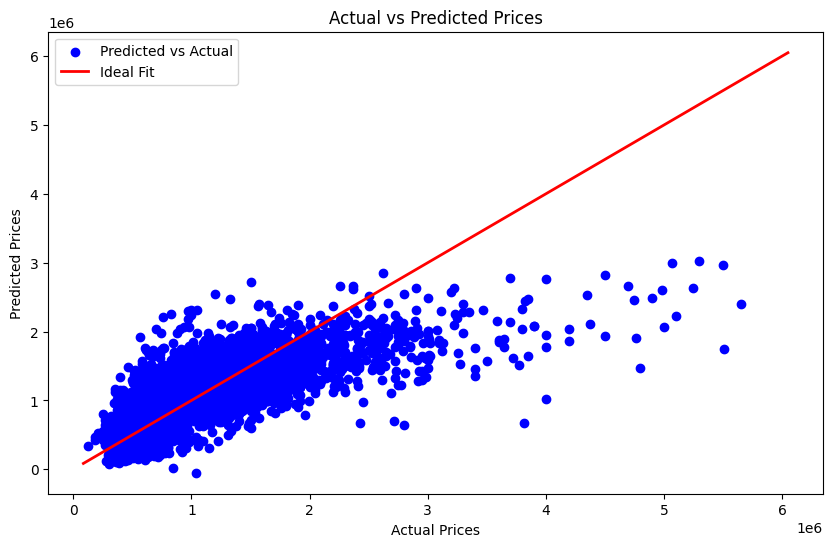

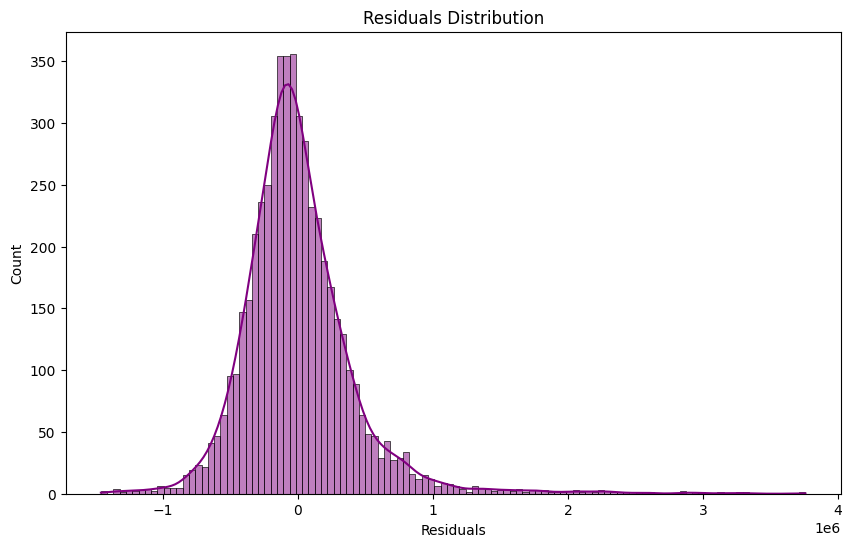

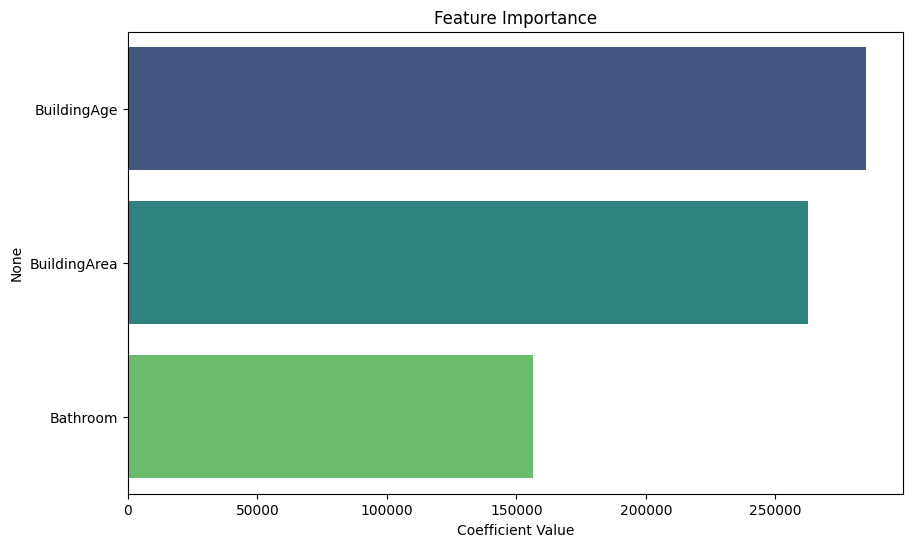

In [62]:
features = ['Bathroom', 'BuildingArea', 'BuildingAge'] 
run_multiple_linear_regression(features)

'Bathroom', 'BuildingArea', and 'BuildingAge' combined also have a decent R-square. I also tried the combination of Bedroom2 and Rooms to replace Bathroom, but Bathroom had the best result even though these three features are highly correlated.